# DLBS Minichallenge
Weiping Zhang, FHNW, 2023 HS

- GOAL: apply semantic segmentation algorithms on dental x-ray images to identify the teeth.
- Data: dental x-ray images, masks, annotation files
- Methods: UNet and modified UNet
- Loss: weighted binary cross entropy
- Metrics: IoU, pixel accuracy, pixel precision
- Framework: Pytorch

In [1]:
import pandas as pd
import json
import numpy as np
from collections import Counter
import torch
import torch.nn as nn
import os
import albumentations as A
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
import seaborn as sns
import torch.optim as optim
import shutil
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader, Subset
from efficientnet_pytorch import EfficientNet
from PIL import Image
import wandb

In [2]:
wandb.login()
api = wandb.Api()

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: weiping-zhang (data_science2021). Use `wandb login --relogin` to force relogin


# 1 Data Analysis

I will use the open access dental x-rays dataset with 32 classes (each tooth is a class) from [humanintheloop]for this minichallenge (https://humansintheloop.org/resources/datasets/teeth-segmentation-dataset/). 
It contains 
-   598 x-ray images
-   598 json files with the objects information
-   598 masks by machine 
-   598 masks by human (will not be used here)
  
## 1.1 Check intactness of dataset

In [18]:
img_path = "data/Teeth Segmentation JSON/d2/img"
mask_path = "data/Teeth Segmentation JSON/d2/masks_machine"
ann_path = "data/Teeth Segmentation JSON/d2/ann"

def count_files(path,data_type):
    count = 0
    for filename in os.listdir(path):
        if data_type == "image":
            if filename.endswith(".jpg"):
                count += 1
        elif data_type == "mask":
            if filename.endswith(".png"):
                count += 1
        elif data_type == "ann":
            if filename.endswith(".jpg.json"):
                count += 1
    return count
print("There are {} images, {} masks, {} annotations".format(count_files(img_path,"image"), count_files(mask_path,"mask"), count_files(ann_path,"ann")))

There are 598 images, 598 masks, 598 annotations


The data amount is equal to the description. This means, I have loaded the whole dataset.


## 1.2 Inspect the images quality visually
Display one group of image and mask:

Text(0.5, 1.0, 'Mask')

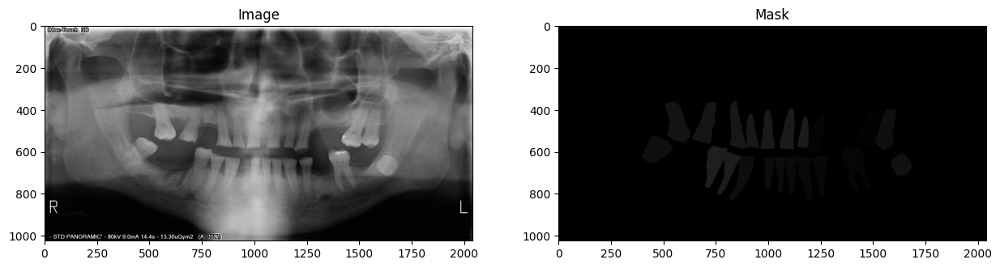

In [19]:
img = cv2.imread("data/Teeth Segmentation JSON/d2/img/1.jpg")
mask = cv2.imread("data/Teeth Segmentation JSON/d2/masks_machine/1.png")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
ax1.imshow(img)
ax1.set_title("Image")
ax2.imshow(mask)
ax2.set_title("Mask")

- The image and mask have the same image size. In the mask, only the teeth are visiable, the non-teeth area are totally black.
- Each tooth in mask has its own specific pixel value, indicating each tooth is one class. 
- By observing the teeth shape and location, I could say that, the image and mask are correctly paired.
- The mask has very low brightness. Some teeth are hardly visible. 
## 1.3 Check pixel values distribution

Text(0.5, 0, 'Pixel Value')

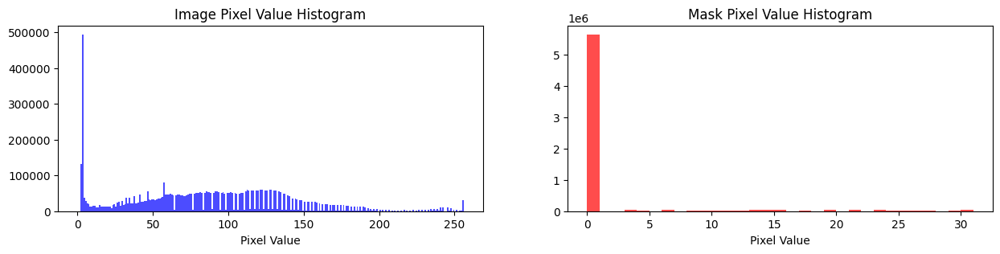

In [20]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 3))
ax1.hist(img.ravel(), bins=max(img.ravel())+1, range=(0, max(img.ravel())+1), density=False, color='b', alpha=0.7)
ax1.set_title('Image Pixel Value Histogram')
ax1.set_xlabel('Pixel Value')
ax2.hist(mask.ravel(), bins=max(mask.ravel())+1, range=(0, max(mask.ravel())+1), density=False, color='r', alpha=0.7)
ax2.set_title('Mask Pixel Value Histogram')
ax2.set_xlabel('Pixel Value')

- The image has continous pixel values distributed from 0 and 255, with peak at 0 pixel value indicating total black.
- The mask has only a few pixel values, each indicating a different class or tooth. The pixel value 0 indicates the non-teeth areas.

## 1.4 Check tooth class distribution
Each image in the dataset has 32 labels, which means each tooth is a class. I will re-label them into four dental categories: incisor, canine, premolars, molar, and to check if the distribution matches to the reality truth.

In [21]:
all_class_titles = []
new_class_titles = []

for filename in os.listdir(ann_path):
    if filename.endswith(".json"):
      
        file_path = os.path.join(ann_path, filename)
        
        with open(file_path, "r") as f:
            data = json.load(f)
        for obj in data['objects']:
            class_title = obj['classTitle']
            all_class_titles.append(class_title)

        # map the classTitle from number to incisor, canine, premolars, molar
        for obj in data['objects']:
            if obj['classTitle'] in {'1', '2', '3', '14', '15', '16', '17', '18', '19', '30', '31', '32'}:
                obj['classTitle'] = "molar"
            elif obj['classTitle'] in {'4', '5', '12', '13', '20', '21', '28', '29'}: 
                obj['classTitle'] = "premolar"
            elif obj['classTitle'] in {'7', '8', '9', '10', '23', '24', '25', '26'}: 
                obj['classTitle'] = "incisor"
            elif obj['classTitle'] in {'6', '11', '22', '27'}: 
                obj['classTitle'] = "canine"
            new_class_titles.append(obj['classTitle'])
        os.makedirs('data/Teeth Segmentation JSON/d2/ann_4class', exist_ok=True)
        with open('data/Teeth Segmentation JSON/d2/ann_4class/' + filename, 'w') as f:
                json.dump(data, f)
 

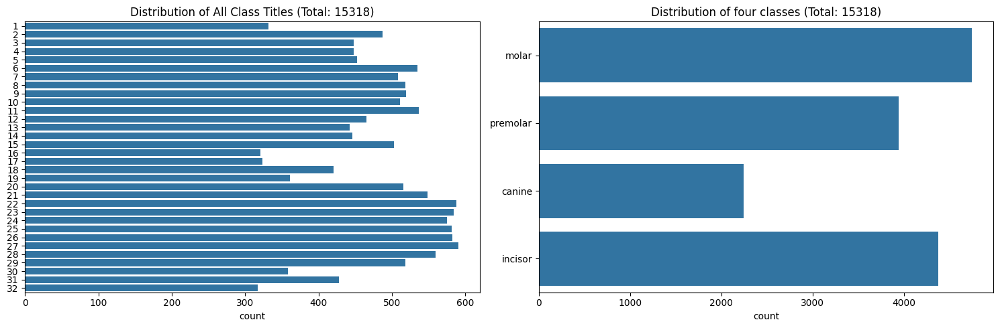

In [22]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

ax1.set_title(f'Distribution of All Class Titles (Total: {len(all_class_titles)})')
ax2.set_title(f'Distribution of four classes (Total: {len(new_class_titles)})')

specific_order = numbers_as_strings = [str(i) for i in range(1, 33)]
sns.countplot(y=all_class_titles, ax=ax1, order=specific_order)
sns.countplot(y=new_class_titles, ax=ax2)

plt.tight_layout()
plt.show()

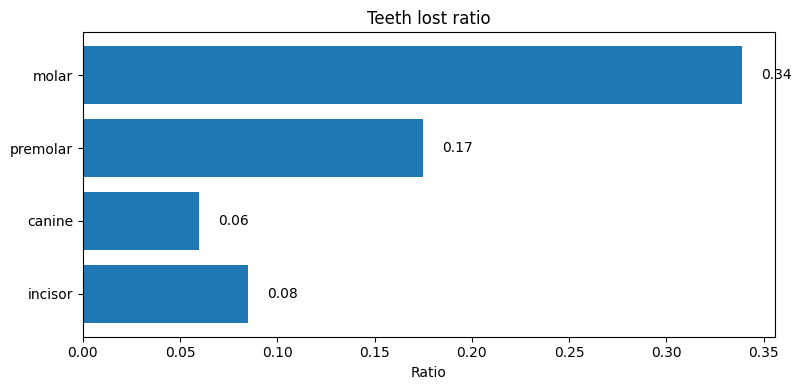

In [23]:
category_counts = Counter(new_class_titles)
teeth_lost_ratio = {}
count_ann = count_files(ann_path,'ann')

for category, count in category_counts.items():
    if category == 'molar':
        teeth_lost_ratio['molar'] = 1 - count / (12*count_ann)
    elif category == 'premolar':
        teeth_lost_ratio['premolar']  = 1 - count / (8*count_ann)
    elif category == 'incisor':
        teeth_lost_ratio['incisor']  = 1 - count / (8*count_ann)
    elif category == 'canine':
        teeth_lost_ratio['canine']  = 1 - count / (4*count_ann)

categories = list(teeth_lost_ratio.keys())
values = list(teeth_lost_ratio.values())
custom_order = ['incisor','canine', 'premolar', 'molar' ]
sorting_key = lambda category: custom_order.index(category)

sorted_data = sorted(zip(categories, values), key=lambda x: sorting_key(x[0]))
categories, values = zip(*sorted_data)

plt.figure(figsize=(8, 4))
bars = plt.barh(categories, values)  
plt.xlabel('Ratio')
plt.title('Teeth lost ratio')
plt.tight_layout()

for bar, value in zip(bars, values):
    plt.text(bar.get_width() + 0.01, bar.get_y() + bar.get_height() / 2, f'{value:.2f}', ha='left', va='center')
plt.show()

result interpretation:

-   The number of teeth in the human mouth is 32, including 8 incisors, 4 canines, 8 premolars and 12 molars.
-   In the first image, we could see the distribution is almost symmetrical. The teeth in the middle have larger amount than at the edges. Wisdom teeth have the smallest amount, the central incisors, cannines have the largest amount. This matches the distributions given in the literature: missing wisdom teeth are the most common lost teeth; least missing teeth are central incisors, canines. This means that this data set is representative.

-   In the second image, we could see that the number of molar is the largest, followed by incisor, premolar and canine.

-   The last figure tells the teeth lost ratio of four categories, the molar teeth has the highest lost ratio, followed by premolar, incisor and canine. The results still match to literatures.

In total, the distribution of this dataset is similar to reality. Therefore they are representative.

In [24]:
Counter(new_class_titles)

Counter({'molar': 4744, 'premolar': 3947, 'canine': 2249, 'incisor': 4378})

In [25]:
def check_image_size(folder_path):
    img_size = []
    for filename in os.listdir(folder_path):
        if filename.endswith(".jpg") or filename.endswith(".png"):
            
            file_path = os.path.join(folder_path, filename)
            img = mpimg.imread(file_path)
           
            size = img.shape
            img_size.append(size)
  
    return set(img_size)

img_path = "data/Teeth Segmentation JSON/d2/img"
mask_path = "data/Teeth Segmentation JSON/d2/masks_machine"
check_image_size(img_path), check_image_size(mask_path)

({(1024, 1394),
  (1024, 1850),
  (1024, 1852),
  (1024, 2038),
  (1024, 2041),
  (1024, 2043),
  (1024, 2045)},
 {(1024, 1394),
  (1024, 1850),
  (1024, 1852),
  (1024, 2038),
  (1024, 2041),
  (1024, 2043),
  (1024, 2045)})

## 1.5 Data preprocessing
-   resize to 256 x 256
-   split to train, validation, test set
-   apply augmentation to trainset: random horizontal flip, vertical flip,  brightness and contrast, rotation

In [26]:
# input paths
img_path = "data/Teeth Segmentation JSON/d2/img"
mask_path = "data/Teeth Segmentation JSON/d2/masks_machine"
ann_path = "data/Teeth Segmentation JSON/d2/ann"
# output paths
train_dir = "data/Teeth Segmentation JSON/d2/train_data"
train_img = "data/Teeth Segmentation JSON/d2/train_data/img"
train_mask = "data/Teeth Segmentation JSON/d2/train_data/mask"
train_ann = "data/Teeth Segmentation JSON/d2/train_data/ann"
valid_dir = "data/Teeth Segmentation JSON/d2/valid_data"
valid_img = "data/Teeth Segmentation JSON/d2/valid_data/img"
valid_mask = "data/Teeth Segmentation JSON/d2/valid_data/mask"
valid_ann = "data/Teeth Segmentation JSON/d2/valid_data/ann"
test_dir = "data/Teeth Segmentation JSON/d2/test_data"
test_img = "data/Teeth Segmentation JSON/d2/test_data/img"
test_mask = "data/Teeth Segmentation JSON/d2/test_data/mask"
test_ann = "data/Teeth Segmentation JSON/d2/test_data/ann"

dir_lst = [img_path, mask_path, ann_path, train_dir, train_img, train_mask, train_ann, valid_dir, valid_img, valid_mask, valid_ann, test_dir, test_img, test_mask, test_ann]

In [27]:
train_ratio = 0.7  
valid_ratio = 0.15  
test_ratio = 0.15  

def create_new_dir(path):
    '''
    if the directory doesn't exist, create it.
    if the directory already exists, delete it and the files in it, then create the directory. 
    '''
    if os.path.exists(path):
        shutil.rmtree(path)
    os.makedirs(path, exist_ok=True)

def count_positive_pixels(mask):
    '''
    count positive pixels in an image
    '''
    mask[mask > 0] = 1
    return np.sum(mask)   

def split_aug_data(dir_lst, n_aug):
    '''
    Resize images to 256*256 pixels; 
    split to train, validation, test set; 
    apply agumentation to images in trainset.
    '''
    img_path, mask_path, ann_path, train_dir, train_img, train_mask, train_ann, valid_dir, valid_img, valid_mask, valid_ann, test_dir, test_img, test_mask, test_ann = dir_lst
    
    for path in dir_lst[3:]:
        create_new_dir(path)
        
    files = [file for file in os.listdir(img_path) if file.endswith(".jpg")]

    random.seed(43)
    random.shuffle(files)

    total_files = len(files)
    num_train = int(train_ratio * total_files)
    num_valid = int(valid_ratio * total_files)
    num_test = total_files - num_train - num_valid

    train_files = files[:num_train]
    valid_files = files[num_train:(num_train + num_valid)]
    test_files = files[(num_train + num_valid):]
    train_pos_pixel_count_lst, valid_pos_pixel_count_lst, test_pos_pixel_count_lst = [], [], []
    
    for file in files:
        img = cv2.imread(os.path.join(img_path, file), cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(os.path.join(mask_path,file.replace('.jpg', '.png')),cv2.IMREAD_GRAYSCALE)

        with open(os.path.join(ann_path,file.replace('.jpg', '.jpg.json'))) as f:
            ann = json.load(f)
      
        img = cv2.resize(img, (256, 256))
        mask = cv2.resize(mask, (256, 256)) 
        for obj in ann['objects']:
            obj['points']['exterior'] = [[x * (256 / img.shape[1]), y * (256 / img.shape[0])] for x, y in obj['points']['exterior']]
    
        if file in train_files:
            cv2.imwrite(os.path.join(train_img,file), img)
            cv2.imwrite(os.path.join(train_mask,file.replace('.jpg','.png')), mask)
            with open(os.path.join(train_ann,file.replace('.jpg','.jpg.json')), 'w') as f:
                json.dump(ann, f)
         
            train_pos_pixel_count_lst.append(count_positive_pixels(mask))

            transform = A.Compose([
                A.HorizontalFlip(p=0.9),  # Randomly apply horizontal flip
                A.VerticalFlip(p=0.9),  # Randomly apply vertical flip
                A.RandomBrightnessContrast(p=0.9),  # Randomly adjust brightness and contrast
                A.Rotate(limit=90, p=0.9)])  # Randomly rotate by up to 90 degrees
        
            # Generate n augmentation images to each train image
            for i in range(n_aug):
                transformed = transform(image=img, mask=mask, json_annotation=ann)
                transformed_image = transformed['image']
                transformed_mask = transformed['mask']
                transformed_json_annotation = transformed['json_annotation']
                cv2.imwrite(os.path.join(train_img,file.replace('.jpg','_t{}.jpg'.format(i+1))), transformed_image)
                cv2.imwrite(os.path.join(train_mask,file.replace('.jpg','_t{}.png'.format(i+1))), transformed_mask)
                with open(os.path.join(train_ann,file.replace('.jpg','_t{}.jpg.json'.format(i+1))), 'w') as f:
                    json.dump(transformed_json_annotation, f)

        
        elif file in valid_files:
            cv2.imwrite(os.path.join(valid_img,file), img)
            cv2.imwrite(os.path.join(valid_mask,file.replace('.jpg','.png')), mask)

            
            with open(os.path.join(valid_ann,file.replace('.jpg','.jpg.json')), 'w') as f:
                json.dump(ann, f)
            valid_pos_pixel_count_lst.append(count_positive_pixels(mask))
      
        elif file in test_files:
            cv2.imwrite(os.path.join(test_img,file), img)
            cv2.imwrite(os.path.join(test_mask,file.replace('.jpg','.png')), mask)
            
            with open(os.path.join(test_ann,file.replace('.jpg','.jpg.json')), 'w') as f:
                json.dump(ann, f)
            test_pos_pixel_count_lst.append(count_positive_pixels(mask))
    
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 3))
    ax1.hist(train_pos_pixel_count_lst, color='b', alpha=0.7)
    ax1.set_title('Trainset')
    ax1.set_xlabel('Number of positive Pixels per Mask')
    ax2.hist(valid_pos_pixel_count_lst, color='b', alpha=0.7)
    ax2.set_title('Validationset')
    ax2.set_xlabel('Number of positive Pixels per Mask')
    ax3.hist(test_pos_pixel_count_lst, color='b', alpha=0.7)
    ax3.set_title('Testset')
    ax3.set_xlabel('Number of positive Pixels per Mask')
    plt.show()
    print("There are {} images in Trainset, {} images in Validationset, {} images in testset".format(count_files(train_img,'image'),count_files(valid_img,'image'),count_files(test_img,'image')))

## 1.6 Apply 1x augmentation 
apply only for the images in train set, this means each image gets one random augumented image.

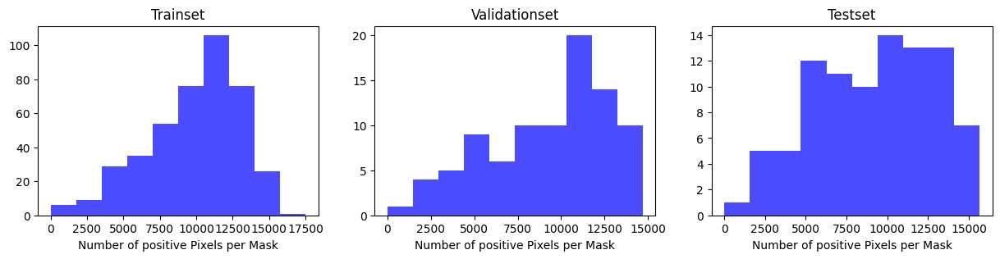

There are 836 images in Trainset, 89 images in Validationset, 91 images in testset


In [28]:
split_aug_data(dir_lst, 1)

All three dataset have similar distributions of positive pixel counts.

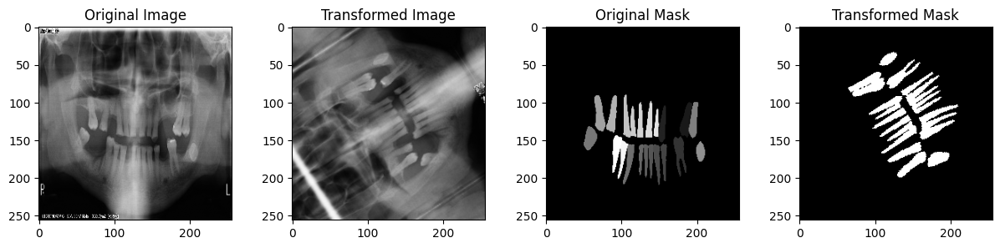

In [29]:
image = cv2.imread(os.path.join(train_img, '1.jpg'))
mask = cv2.imread(os.path.join(train_mask, '1.png'))
transformed_image = cv2.imread(os.path.join(train_img, '1_t1.jpg'))
transformed_mask = cv2.imread(os.path.join(train_mask, '1_t1.png'))
fig, (ax1, ax2,ax3,ax4) = plt.subplots(1, 4, figsize=(15, 3))
ax1.imshow(image/max(image.flatten()), cmap='gray')
ax1.set_title('Original Image')
ax2.imshow(transformed_image/max(transformed_image.flatten()), cmap='gray')
ax2.set_title('Transformed Image')
ax3.imshow(mask/max(mask.flatten()), cmap='gray')
ax3.set_title('Original Mask')
ax4.imshow(transformed_mask/max(transformed_mask.flatten()), cmap='gray')
ax4.set_title('Transformed Mask')
plt.show()

The transformed image and mask are correctly paired. This suggests my data preprocessing works properly.

In [30]:
class CustomSegmentationDataset(Dataset):
    def __init__(self, image_dir, mask_dir, annotation_dir, transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.annotation_dir = annotation_dir
        self.transform = transform

        self.image_files = os.listdir(image_dir)
        self.mask_files = os.listdir(mask_dir)
        self.annotation_files = os.listdir(annotation_dir)

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = os.path.join(self.image_dir, self.image_files[idx])
        mask_name = os.path.join(self.mask_dir, self.image_files[idx].replace('.jpg', '.png'))
        annotation_name = os.path.join(self.annotation_dir, self.image_files[idx].replace('.jpg', '.jpg.json'))
        
        image = cv2.imread(img_name)
        mask = Image.open(mask_name)
        annotation = open(annotation_name, 'r').read()
        
        image = np.array(image) / 255.0  # Normalize image
        mask = np.array(mask) / 30.0     # Normalize mask
        # Round mask values to 0 or 1
        mask[mask > 0] = 1
        mask[mask <= 0] = 0

        if self.transform:
            image = self.transform(image)
            mask = self.transform(mask)

        return {'image': image, 'mask': mask}

transform = transforms.Compose([transforms.ToTensor()]) 

custom_dataset_train = CustomSegmentationDataset(train_img, train_mask, train_ann, transform=transform)
custom_dataset_valid = CustomSegmentationDataset(valid_img, valid_mask, valid_ann, transform=transform)
custom_dataset_test = CustomSegmentationDataset(test_img, test_mask, test_ann, transform=transform)


batch_size = 10  
train_loader = DataLoader(custom_dataset_train, batch_size=batch_size, shuffle=False, num_workers=0)
valid_loader = DataLoader(custom_dataset_valid, batch_size=batch_size, shuffle=False, num_workers=0)
test_loader = DataLoader(custom_dataset_test, batch_size=batch_size, shuffle=False, num_workers=0)

dataset_train_small = Subset(custom_dataset_train, list(range(10)))
dataset_valid_small = Subset(custom_dataset_valid, list(range(10)))
dataset_test_small = Subset(custom_dataset_test, list(range(10)))

train_loader_small = DataLoader(dataset_train_small, batch_size=5, shuffle=False, num_workers=0)
valid_loader_small = DataLoader(dataset_valid_small, batch_size=5, shuffle=False, num_workers=0)
test_loader_small = DataLoader(dataset_test_small, batch_size=5, shuffle=False, num_workers=0)

## 1.7 Create dataloader

torch.Size([10, 3, 256, 256])


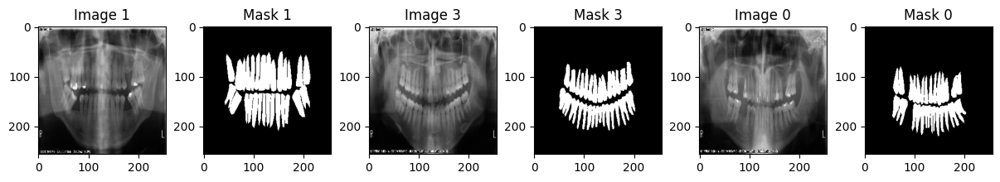

torch.Size([10, 3, 256, 256])


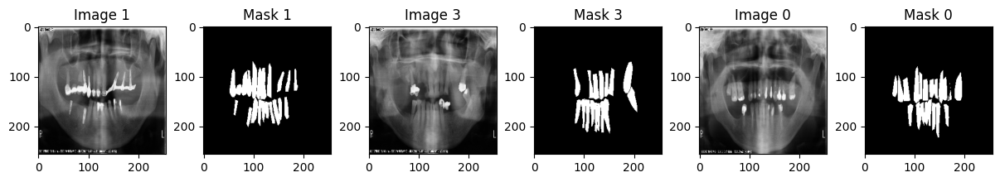

torch.Size([10, 3, 256, 256])


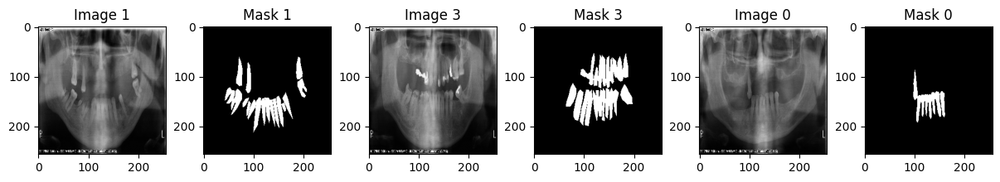

torch.Size([5, 3, 256, 256])


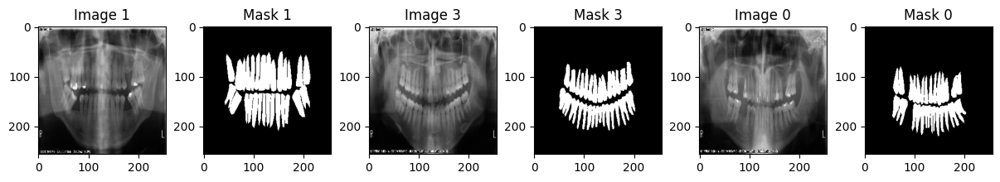

torch.Size([5, 3, 256, 256])


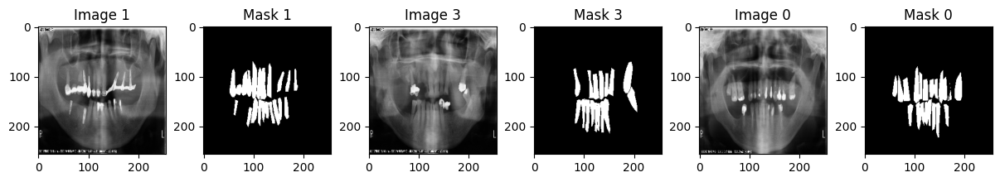

torch.Size([5, 3, 256, 256])


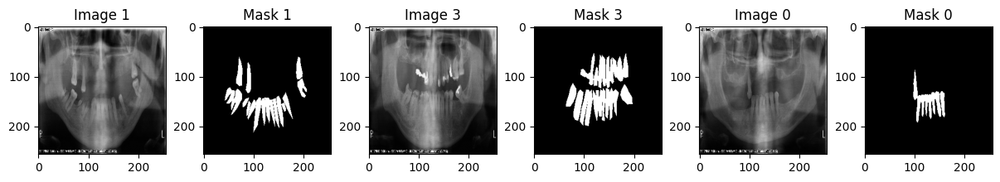

In [31]:
lst = [train_loader, valid_loader, test_loader, train_loader_small, valid_loader_small, test_loader_small]
for data_loader in lst:
    for batch in data_loader:
        images = batch['image']
        masks = batch['mask']
        print(images.shape)
        fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(1, 6, figsize=(15, 2))
        ax1.imshow(images[1].permute(1, 2, 0).cpu().numpy(), cmap='gray')
        ax1.set_title('Image 1')
        ax2.imshow(masks[1].permute(1, 2, 0).cpu().numpy(), cmap='gray')
        ax2.set_title('Mask 1')
        ax3.imshow(images[3].permute(1, 2, 0).cpu().numpy(), cmap='gray')
        ax3.set_title('Image 3')
        ax4.imshow(masks[3].permute(1, 2, 0).cpu().numpy(), cmap='gray')
        ax4.set_title('Mask 3')
        ax5.imshow(images[0].permute(1, 2, 0).cpu().numpy(), cmap='gray')
        ax5.set_title('Image 0')
        ax6.imshow(masks[0].permute(1, 2, 0).cpu().numpy(), cmap='gray')
        ax6.set_title('Mask 0')
        plt.show()
        break

-   All 18 groups of images and the corresponding masks are correctly paired.

## Summary of data analysis:

- Though the dataset includes only 598 images, the masks and annotation files are available and accurately labeled.
It convers images from not only adult, but also children teeth. The distribution of all available teeth match to the teeth decay rules in reality, this suggests the dataset is representative samples for reality. 
- Applying image augmentation on trainset can largely improve the model performance on reducing the overfitting, enhancing the generalization. To save computation cost, I will start with 1 x augmentation, which means one augmented image for each train image.

# 2 Model architectures

I select U-Net model for this challenge, because U-Net is particularly well-suited for tasks like medical image segmentation, due to its architecture could efficiently capture both context and localization information, and it can achieve good performance even with small datasets. 

I would setup a baseline U-Net with simple architecture, to compare with a modified U-Net model with pretrained efficient-b4 model as encoder.

## 2.1 Baseline: simple U-Net model  

In [32]:
class UNet(nn.Module):
    def __init__(self, dropout_rate = 0):
        super(UNet, self).__init__()
        self.dropout_rate = dropout_rate
        # Encoder
        self.encoder1 = self.encoder_block(3, 144) # for example, 256 -> 128
        self.encoder2 = self.encoder_block(144, 192) # 128 -> 64
        self.encoder3 = self.encoder_block(192, 336) # 64 -> 32
        self.encoder4 = self.encoder_block(336, 960) # 32 -> 16

        # Middle sub-block
        self.middle = self.middle_sub_block(960, 512)  # 16 -> 8

        # Decoder
        self.decoder1 = self.decoder_block(512, 256) # 8 -> 16
        self.decoder2 = self.decoder_block(256, 128) # 16 -> 32
        self.decoder3 = self.decoder_block(128, 64) # 32 -> 64
        self.decoder4 = self.decoder_block(64, 32) # 64 -> 128
        self.decoder5 = self.decoder_block(32, 16) # 128 -> 256
        # Output layer
        self.output_layer = nn.Conv2d(16, 1, kernel_size=1) # 256 -> 256
     
    def encoder_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Identity(), 
            nn.ZeroPad2d((0, 1, 0, 1)),
            nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, stride=2, padding=0),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=False))

    def middle_sub_block(self, in_channels, out_channels): 
        return nn.Sequential(
            nn.LeakyReLU(inplace=False),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Dropout2d(p=self.dropout_rate),
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=False),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=False)
        )

    def decoder_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2),
            nn.Dropout2d(p=self.dropout_rate),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=False),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=False)
        )

    def forward(self, x):
        enc1= self.encoder1(x)
        enc2 = self.encoder2(enc1)
        enc3 = self.encoder3(enc2)
        enc4 = self.encoder4(enc3)


        # Middle sub-block
        middle = self.middle(enc4)

        # Decoder
        dec1 = self.decoder1(middle)
        dec2 = self.decoder2(dec1)
        dec3 = self.decoder3(dec2)
        dec4 = self.decoder4(dec3)
        dec5 = self.decoder5(dec4)

        # Output layer
        output = self.output_layer(dec5)
        return output

# Create the UNet model
model = UNet()
print(model)

UNet(
  (encoder1): Sequential(
    (0): Identity()
    (1): ZeroPad2d((0, 1, 0, 1))
    (2): Conv2d(3, 144, kernel_size=(3, 3), stride=(2, 2))
    (3): BatchNorm2d(144, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.01)
  )
  (encoder2): Sequential(
    (0): Identity()
    (1): ZeroPad2d((0, 1, 0, 1))
    (2): Conv2d(144, 192, kernel_size=(3, 3), stride=(2, 2))
    (3): BatchNorm2d(192, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.01)
  )
  (encoder3): Sequential(
    (0): Identity()
    (1): ZeroPad2d((0, 1, 0, 1))
    (2): Conv2d(192, 336, kernel_size=(3, 3), stride=(2, 2))
    (3): BatchNorm2d(336, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.01)
  )
  (encoder4): Sequential(
    (0): Identity()
    (1): ZeroPad2d((0, 1, 0, 1))
    (2): Conv2d(336, 960, kernel_size=(3, 3), stride=(2, 2))
    (3): BatchNorm2d(960, eps=1e-0

## 2.2 UNet with pretrained efficientnet-b4 as encoder

Use a pretrained efficientnet-b4 as encoder block. The whole UNet architecture (encoder, middle_block, decoder) is copied from this paper: 
Liu, W., Luo, J., Yang, Y. et al. Automatic lung segmentation in chest X-ray images using improved U-Net. Sci Rep 12, 8649 (2022). https://doi.org/10.1038/s41598-022-12743-y

In [33]:
class UNet_efficientnet_b4(nn.Module):
    def __init__(self, dropout_rate = 0):
        # input data should have 3 channels
        super(UNet_efficientnet_b4, self).__init__()
        self.dropout_rate = dropout_rate

        # Encoder
        self.encoder = self.encoder_block_efficientnet_b4()
        for param in self.encoder.parameters():
            param.requires_grad = False
        # Middle sub-block
        self.middle = self.middle_sub_block(960, 512)  # 16 -> 8

        # Decoder
        self.decoder1 = self.decoder_block(512, 256) # 8 -> 16
        self.decoder2 = self.decoder_block(256, 128) # 16 -> 32
        self.decoder3 = self.decoder_block(128, 64) # 32 -> 64
        self.decoder4 = self.decoder_block(64, 32) # 64 -> 128
        self.decoder5 = self.decoder_block(32, 16) # 128 -> 256
        # Output layer
        self.output_layer = nn.Conv2d(16, 1, kernel_size=1) # 256 -> 256
        # sigmoid will be applied in the training loop
     
    def encoder_block_efficientnet_b4(self):
        eff_b4 = EfficientNet.from_pretrained('efficientnet-b4')
        encoder = nn.Sequential(
            eff_b4._conv_stem,  # Add Phase 0 
            eff_b4._bn0,    # Add Phase 1
        )
        for block_idx in range(22):  # Add blocks 0 to 21
            block = eff_b4._blocks[block_idx]
            encoder.add_module(f'block_{block_idx}', block)
        # Select the expand convolutional layer and batch normalization layer of the block 22
        encoder.add_module('block_22_expand_conv', eff_b4._blocks[22]._expand_conv)
        encoder.add_module('block_22_expand_bn', eff_b4._blocks[22]._bn0)
        return encoder


    def middle_sub_block(self, in_channels, out_channels): # half the image size
        # downsampling: leakyrelu, 2*2 max pooling, dropout
        # 3*3 convolution, 2* residual block, leaky relu
        return nn.Sequential(
            nn.LeakyReLU(inplace=False),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Dropout2d(p=self.dropout_rate),
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            # residual block 1
            nn.LeakyReLU(inplace=False),
            nn.BatchNorm2d(out_channels),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=False),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            # residual block 2
            nn.LeakyReLU(inplace=False),
            nn.BatchNorm2d(out_channels),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=False),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=False)
        )

    def decoder_block(self, in_channels, out_channels):
        # upsampling: conv2Dtranspose
        # dropout, 3*3 convolution, 2* residual block, LeakyReLU
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2),
            nn.Dropout2d(p=self.dropout_rate),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            # residual block 1
            nn.LeakyReLU(inplace=False),
            nn.BatchNorm2d(out_channels),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=False),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            # residual block 2
            nn.LeakyReLU(inplace=False),
            nn.BatchNorm2d(out_channels),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=False),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=False)
        )

    def forward(self, x):
        # Encoder
        enc = self.encoder(x)

        # Middle sub-block
        middle = self.middle(enc)

        # Decoder
        dec1 = self.decoder1(middle)
        dec2 = self.decoder2(dec1)
        dec3 = self.decoder3(dec2)
        dec4 = self.decoder4(dec3)
        dec5 = self.decoder5(dec4)

        # Output
        output = self.output_layer(dec5)
        return output
        
model = UNet_efficientnet_b4()       

Loaded pretrained weights for efficientnet-b4


# 3 Train and evaluation
## 3.1 Metrics
-   IoU: intersection over union
-   accuracy
-   precision

In [34]:
def cal_metrics(y_pred, y_true, threshold=0.5):
    y_pred = y_pred.detach().numpy().flatten()
    y_true = y_true.detach().numpy().flatten()
    y_pred[y_pred >= threshold] = 1
    y_pred[y_pred < threshold] = 0
    
    intersection = np.logical_and(y_true, y_pred)
    union = np.logical_or(y_true, y_pred)
    if union.sum() == 0:
        iou = 0
    else:
        iou = np.sum(intersection) / np.sum(union)
    
    tp = np.sum((y_true == 1) & (y_pred == 1))
    fp = np.sum((y_true == 0) & (y_pred == 1))
    tn = np.sum((y_true == 0) & (y_pred == 0))
    fn = np.sum((y_true == 1) & (y_pred == 0))
   
    accuracy = (tp + tn) / (tp + tn + fp + fn)
    if tp + fp == 0:
        precision = 1
    else:
        precision = tp / (tp + fp)
    return iou, accuracy, precision

## 3.2 Class weights 
Visualizing the masks, it is obvious that there are more negative pixels than positive. To handle the class imbalance, I will introduce weights to the loss function to avoid bias on the major class. 

- count the positive pixels and zero pixels of all masks for weighted loss

In [35]:
# loop through all masks in the mask_path, and count the number of pixels where pixel value > 0, and where pixel value = 0
count_positive, count_zero = 0, 0
for path in [train_mask, valid_mask, test_mask]:
    for filename in os.listdir(path):
        if filename.endswith(".png"):
            mask = cv2.imread(path + "/" + filename, cv2.IMREAD_GRAYSCALE)
            mask = np.where(mask > 0, 1, 0)
            count_1 = np.sum(mask)
            count_positive += count_1
            count_zero += mask.shape[0] * mask.shape[1] - count_1
print("There are {} white pixels, {} black pixels in the mask".format(count_positive, count_zero)) # (9881204, 56703372)

# Calculate weights based on class distribution
weight_0 = (count_zero + count_positive) / (2 * count_zero)
weight_1 = (count_zero + count_positive) / (2 * count_positive)
# ensure they sum up to 1
total_weight = weight_0 + weight_1
weight_0 = weight_0/total_weight
weight_1 = weight_1/total_weight
weight_0, weight_1

There are 9933445 white pixels, 56651131 black pixels in the mask


(0.14918537590447373, 0.8508146240955262)

## 3.3 Train and evaluation process
I includes the following points:
- loss: weighted binary cross entropy loss
- Adam optimizer
- Small dataloader for quickly testing the model learning ability. Afterwards, train the model on full dataloader. 
- Configurations: learning_rate, batch_size, regularization_strength, dropout_rate, pred_threshold (pixel value larger than threshold -> 1, else -> 0)
- Early stop: here i use early stop not for prevent overfitting, but for avoiding further computing when the train loss is not anymore decreasing.
- Save models: the model with the least validation loss and the model with the least train loss will be saved at the corresponding epoch.
- learning rate decay: when loss is not decreased over a certain epochs, the learning rate will be decreased by 50%. This helps fine-tuning the model parameters.

In [36]:
def train_eval_model(config):
    wandb.init()
    config = wandb.config
    epochs = config['epochs']
    
    if config['model'] == 'UNet':
        model = UNet(dropout_rate=config['dropout_rate'])
    elif config['model'] == 'UNet_efficientnet_b4':
        model = UNet_efficientnet_b4(dropout_rate=config['dropout_rate'])
    
    learning_rate = config['learning_rate']

    # optimizer with l2 regularization (weight decay)
    optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=config['regularization_strength'])
    sigmoid = nn.Sigmoid()

    # add early stopping: if the loss not decrease for a certain epochs, then stop the training process
    early_stop_epochs = config['early_stop_epochs']
    early_stop_threshold = config['early_stop_threshold']
    model_name = config['saved_model_name']
    early_stop_counter, update_lr_counter = 0, 0
    best_loss = float('inf')
    best_valid_loss = float('inf')
    
   
    if config['data_type'] == 'small':
        train_loader = train_loader_small
        valid_loader = valid_loader_small
        criterion = nn.BCELoss() # binary cross entropy loss
    else:
        train_loader = DataLoader(custom_dataset_train, batch_size=config['batch_size'], shuffle=False, num_workers=0)
        valid_loader = DataLoader(custom_dataset_valid, batch_size=config['batch_size'], shuffle=False, num_workers=0)
        # weighted binary cross entropy loss for full dataset
        criterion = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([weight_1]))  
    
    for epoch in range(epochs):
        epoch_loss, epoch_iou, epoch_accuracy, epoch_precision, count_train = 0.0, 0.0, 0.0, 0.0, 0.0
        model.train()
        for param in model.parameters():
            param.requires_grad = True
        for batch in train_loader:
            imgs = batch['image'].float()
            masks = batch['mask'].float()
            optimizer.zero_grad()
            batch_pred = sigmoid(model(imgs))
            loss = criterion(batch_pred, masks)
            
            for i in range(batch_pred.shape[0]):
                pred_ = batch_pred[i]
                mask = masks[i]
                metrics = cal_metrics(pred_, mask, config['pred_threshold'])
                iou, accuracy, precision = metrics
                epoch_iou += iou
                epoch_accuracy += accuracy
                epoch_precision += precision
                count_train += 1

            loss.backward()  
            optimizer.step()  
            epoch_loss += loss.item()
        average_epoch_loss = epoch_loss / count_train
        average_epoch_iou = epoch_iou / count_train
        average_epoch_accuracy = epoch_accuracy / count_train
        average_epoch_precision = epoch_precision / count_train
        
        # check for early stopping and save the best model
        if average_epoch_loss < best_loss: 
            torch.save(model.state_dict(), config['saved_model_name']) 
            if average_epoch_loss < best_loss * early_stop_threshold:
                best_loss = average_epoch_loss
                early_stop_counter = 0
                update_lr_counter = 0
            
        if average_epoch_loss >= best_loss * early_stop_threshold:
            early_stop_counter += 1
            update_lr_counter += 1
            if update_lr_counter >= early_stop_epochs//2 + 1:
                # update learning rate to half
                learning_rate *= 0.5
                optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=config['regularization_strength'])
                update_lr_counter = 0
            if early_stop_counter >= early_stop_epochs:
                print('Early stopping')
                break
        
        wandb.log({"Train Loss": average_epoch_loss}, step=epoch)
        wandb.log({"Train IoU": average_epoch_iou}, step=epoch)
        wandb.log({"Train Accuracy": average_epoch_accuracy}, step=epoch)
        wandb.log({"Train Precision": average_epoch_accuracy}, step=epoch)

        # display the first group of images and masks in last validation batch
        if epoch == epochs - 1:
            pred_b = batch_pred[0].clone().detach()
            # convert predicted values to binary
            pred_b[pred_b >= config['pred_threshold']] = 1
            pred_b[pred_b < config['pred_threshold']] = 0
            fig, (ax1, ax2,ax3,ax4) = plt.subplots(1, 4, figsize=(15, 3))
            ax1.imshow(imgs[0].permute(1, 2, 0).numpy(), cmap='gray')
            ax1.set_title('Train Image')
            ax2.imshow(masks[0].permute(1, 2, 0).numpy(), cmap='gray')
            ax2.set_title('Mask')
            ax3.imshow(batch_pred[0].permute(1, 2, 0).detach().numpy(), cmap='gray')
            ax3.set_title('Prediction')
            ax4.imshow(pred_b.permute(1, 2, 0).detach().numpy(), cmap='gray')
            ax4.set_title(f'Prediction (binary), threshold {config["pred_threshold"]}')
            
            plt.show()
        
       
        model.eval()
        epoch_loss, epoch_iou, epoch_accuracy, epoch_precision, count_valid = 0.0, 0.0, 0.0, 0.0, 0.0
        with torch.no_grad():
            for batch in valid_loader:
                valid_imgs = batch['image'].float()
                valid_masks = batch['mask'].float()
                pred = model(valid_imgs)
                batch_pred = sigmoid(pred)
                loss = criterion(batch_pred, valid_masks)
                epoch_loss += loss.item()
                for i in range(batch_pred.shape[0]):
                    pred_ = batch_pred[i]
                    mask = valid_masks[i]
                    metrics = cal_metrics(pred_, mask, config['pred_threshold'])
                    iou, accuracy, precision = metrics

                    epoch_iou += iou
                    epoch_accuracy += accuracy
                    epoch_precision += precision
                    count_valid += 1

            # display the first group of images and masks in last validation batch
            if epoch == epochs - 1:
                pred_b = batch_pred[0].clone().detach()
                # convert predicted values to binary
                pred_b[pred_b >= config['pred_threshold']] = 1
                pred_b[pred_b < config['pred_threshold']] = 0
                fig, (ax1, ax2,ax3,ax4) = plt.subplots(1, 4, figsize=(15, 3))
                ax1.imshow(valid_imgs[0].permute(1, 2, 0).numpy(), cmap='gray')
                ax1.set_title('Test Image')
                ax2.imshow(valid_masks[0].permute(1, 2, 0).numpy(), cmap='gray')
                ax2.set_title('Mask')
                ax3.imshow(batch_pred[0].permute(1, 2, 0).detach().numpy(), cmap='gray')
                ax3.set_title('Prediction')
                ax4.imshow(pred_b.permute(1, 2, 0).detach().numpy(), cmap='gray')
                ax4.set_title(f'Prediction (binary), threshold {config["pred_threshold"]}')
                plt.show()     
                
            average_epoch_loss = epoch_loss / count_valid
            average_epoch_iou = epoch_iou / count_valid
            average_epoch_accuracy = epoch_accuracy / count_valid
            average_epoch_precision = epoch_precision / count_valid
            
            # save the best model with the lowest validation loss
            if average_epoch_loss < best_valid_loss: 
                torch.save(model.state_dict(), f'{model_name}_best_valid_loss')
                if average_epoch_loss < best_loss * early_stop_threshold:
                    best_loss = average_epoch_loss
                    early_stop_counter = 0
                    update_lr_counter = 0

            wandb.log({"Valid Loss": average_epoch_loss}, step=epoch)
            wandb.log({"Valid IoU": average_epoch_iou}, step=epoch)
            wandb.log({"Valid Accuracy": average_epoch_accuracy}, step=epoch)
            wandb.log({"Valid Precision": average_epoch_precision}, step=epoch)
            

## 3.4 Baseline: Simple UNET
### 3.4.1 Small dataset to test the model's learning efficiently

Create sweep with ID: i4ez6ubn
Sweep URL: https://wandb.ai/weiping-zhang/dlbs/sweeps/i4ez6ubn


wandb: Agent Starting Run: 70ngn9s4 with config:
wandb: 	batch_size: 16
wandb: 	data_type: small
wandb: 	dropout_rate: 0
wandb: 	early_stop_epochs: 15
wandb: 	early_stop_threshold: 0.99
wandb: 	epochs: 200
wandb: 	learning_rate: 0.001
wandb: 	model: UNet
wandb: 	pred_threshold: 0.8
wandb: 	regularization_strength: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


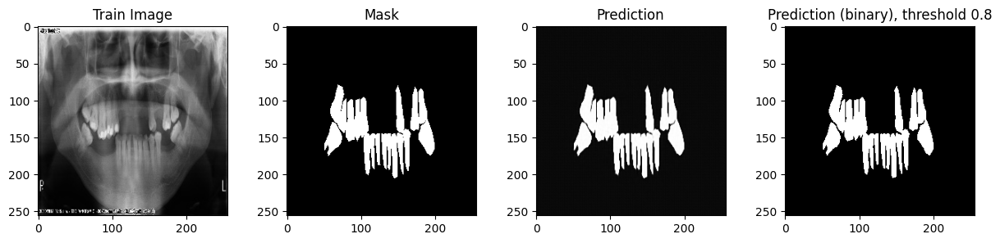

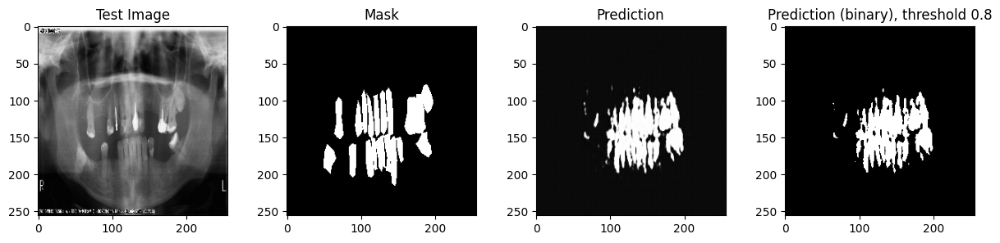

Train Accuracy,▁▂▃▃▃▂▃▃▃▃▄▄▄▅▅▅▅▆▆▇▇▇▇▇▇█▇▇████████████
Train IoU,▁▂▂▂▂▂▂▂▃▃▃▄▄▄▅▅▅▆▆▇▇▇▇▇▇█▇▇████████████
Train Loss,█▇▆▆▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
Train Precision,▁▂▃▃▃▂▃▃▃▃▄▄▄▅▅▅▅▆▆▇▇▇▇▇▇█▇▇████████████
Valid Accuracy,▁▁▁▁▁▁▂▁▁▂▂▃▃▃▅▆▅▅▆▆▇▇▇█▇▇█▇▇███████████
Valid IoU,▁▁▁▁▁▁▂▁▁▂▂▂▃▃▅▅▄▅▆▆▇▇▇▇▇▇█▇▇███████████
Valid Loss,█▇▆▅▄▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂▂▂▂▂▂▂▂
Valid Precision,██████▅▆▇▅▆▅▄▃▂▂▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train Accuracy,0.99682
Train IoU,0.97625
Train Loss,0.00913


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: muj9mwcn with config:
wandb: 	batch_size: 16
wandb: 	data_type: small
wandb: 	dropout_rate: 0
wandb: 	early_stop_epochs: 15
wandb: 	early_stop_threshold: 0.99
wandb: 	epochs: 200
wandb: 	learning_rate: 0.001
wandb: 	model: UNet
wandb: 	pred_threshold: 0.5
wandb: 	regularization_strength: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


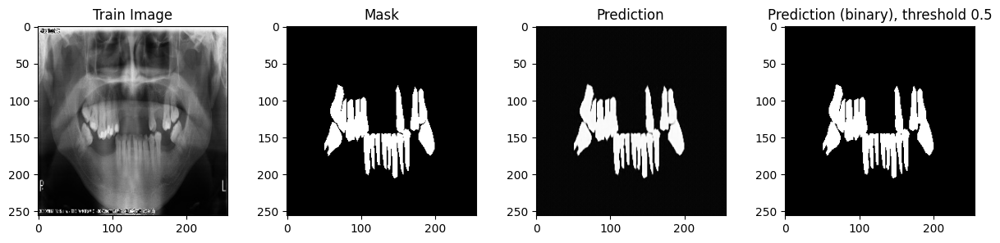

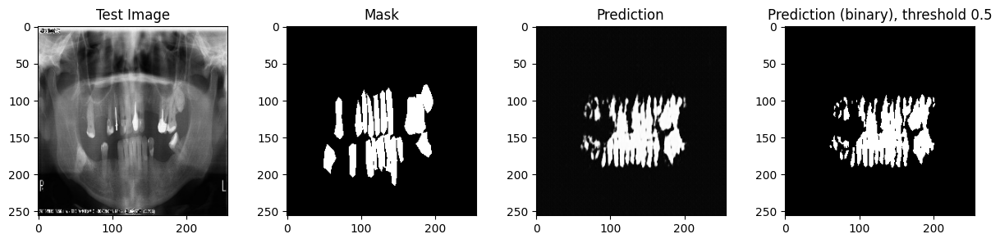

Train Accuracy,▁▅▇▇▇▇▇▇▇▇▇▇▇▇▇█████████████████████████
Train IoU,▁▃▄▅▅▅▅▅▅▆▅▆▆▆▆▆▇▇▇▇▇▇██████████████████
Train Loss,█▇▆▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train Precision,▁▅▇▇▇▇▇▇▇▇▇▇▇▇▇█████████████████████████
Valid Accuracy,▁▁▇█████████████████████████████████████
Valid IoU,▁▁▄▃▁▁▄▇█▇▇███▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇
Valid Loss,██▆▄▃▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▂▂▂▂▂▂▂
Valid Precision,▁▁▄▆▆▅█████████████████████▇████████████
Train Accuracy,0.9982
Train IoU,0.98675
Train Loss,0.00718


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.


In [25]:
# test with small dataset
# https://wandb.ai/weiping-zhang/dlbs/sweeps/i4ez6ubn?workspace=user-weiping-zhang
config = {
    'method': 'grid',
    'metric': {'name': 'Train Loss', 'goal': 'minimize'},
    'parameters': {
        'model': {'values': ['UNet']}, # model type: UNet, UNet_efficientnet_b4
        'data_type': {'values': ['small']}, # data type: small, other
        'pred_threshold': {'values': [0.8,0.5]}, # prediction threshold: pixel value > threshold -> 1, else 0
        'batch_size': {'values': [16]}, 
        'learning_rate': {'values': [0.001]}, 
        'epochs': {'values': [200]},
        'early_stop_epochs': {'values': [15]},
        'early_stop_threshold': {'values': [0.99]},
        'dropout_rate': {'values': [0]},
        'regularization_strength': {'values': [0]}, 
        'saved_model_name':{'values': ['test_best_model.pth']}
    }}
sweep_id = wandb.sweep(config, project="dlbs", entity="weiping-zhang")
wandb.agent(sweep_id, function=lambda: train_eval_model(config))

In [55]:
# https://wandb.ai/weiping-zhang/dlbs/reports/UNet-small-dataset-pixel-value-threshold--Vmlldzo2Mzc3NzA4
%wandb weiping-zhang/dlbs/reports/UNet-small-dataset-pixel-value-threshold--Vmlldzo2Mzc3NzA4 -h 1024

Result interpretation
-   Trainset has IoU, precision, accuracy of 0.999, 0.999, 0.999, this indicates that the model could efficiently learn the training data.
-   The model performance on validation dataset is not good, because the model is overfitting due to the small training datasize.
-   With threshold 0.8 and 0.5, both models have reached similar performance, this means the model is robust to learn the data irrelevant to the threshold.

### 3.4.2 Full dataset

Since both threshold of 0.5 and 0.8 work good on small dataset, I will take a value between them 0.7

Create sweep with ID: 9p29tz62
Sweep URL: https://wandb.ai/weiping-zhang/dlbs/sweeps/9p29tz62


wandb: Agent Starting Run: nys6czvp with config:
wandb: 	batch_size: 16
wandb: 	data_type: large
wandb: 	dropout_rate: 0
wandb: 	early_stop_epochs: 100
wandb: 	early_stop_threshold: 0.99
wandb: 	epochs: 150
wandb: 	learning_rate: 0.001
wandb: 	model: UNet
wandb: 	pred_threshold: 0.7
wandb: 	regularization_strength: 0
wandb: 	saved_model_name: best_model_baseline.pth


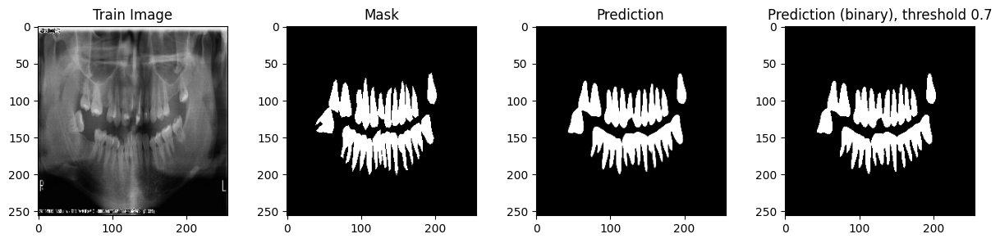

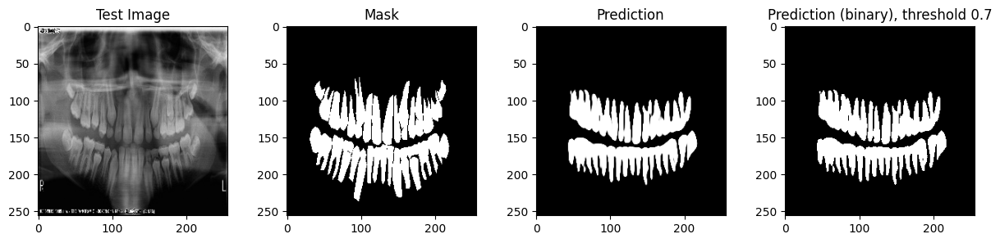

Train Accuracy,▁▂▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇████████
Train IoU,▁▂▃▄▄▄▅▅▄▅▅▅▅▆▆▆▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇██████
Train Loss,█▅▃▂▂▂▂▂▂▂▂▂▂▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train Precision,▁▂▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇████████
Valid Accuracy,▁▄▇▆▇▇▇▇▆▇▆▇▇▇▇▆▇▇▇▇▇▇██▇██▇████████████
Valid IoU,▁▄▇▅▇▇▇▇▆▇▆▇▇▇▆▆▆▇▇▇▇▇██▇██▇███████▇██▇▇
Valid Loss,█▄▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Valid Precision,▁▆▅▇▄▆▇▅▄▇▇▇▇▇▇▇▇▆▅█▇▇▇▇▇▇▇█▇▇▇▆▇▇▇▇▇▇▇▇
Train Accuracy,0.973
Train IoU,0.82411
Train Loss,0.04062


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.


In [44]:
# https://wandb.ai/weiping-zhang/dlbs/sweeps/9p29tz62

config['parameters']['data_type']['values'] = ['large']
config['parameters']['pred_threshold']['values'] = [0.7]
config['parameters']['epochs']['values'] = [150]
config['parameters']['saved_model_name']['values'] =['best_model_baseline.pth']
sweep_id = wandb.sweep(config, project="dlbs", entity="weiping-zhang")
wandb.agent(sweep_id, function=lambda: train_eval_model(config))

In [60]:
%wandb weiping-zhang/dlbs/reports/simple-UNet--Vmlldzo2Mzc4MDk2  -h 1024

Though the loss of trainset is still slowly decreasing, the validation set loss has been flat for a while. This means, training for even more epochs will only improve the trainset performance, not validationset, therefore leading even larger overfitting. Now let's use the trained model to evaluate on the unseen testset.

### 3.4.3 Testset evaluation
evaluate the final model on testset

In [197]:
# load best model and evaluate on the test set
def eval_test(best_model_name):
    model.load_state_dict(torch.load(best_model_name))
    criterion = nn.BCEWithLogitsLoss(pos_weight=torch.tensor([weight_1])) 
    model.eval()
    test_loss, test_img, test_true_mask, test_pred, test_iou, test_accuracy, test_precision, test_count = 0, [], [], [], [], [], [], 0.0
    test_loader = DataLoader(custom_dataset_test, batch_size=16, shuffle=False, num_workers=0)
    with torch.no_grad():
        for batch in test_loader:
            batch_imgs = batch['image'].float()
            batch_masks = batch['mask'].float()
            pred = model(batch_imgs)
            sigmoid = nn.Sigmoid()
            batch_pred = sigmoid(pred)
            batch_loss = criterion(batch_pred, batch_masks)
            test_loss += batch_loss.item()
            for i in range(batch_pred.shape[0]):
                img_ = batch_imgs[i]
                pred_ = batch_pred[i]
                mask = batch_masks[i]
                metrics = cal_metrics(pred_, mask, 0.2) 
                iou, accuracy, precision = metrics
               
                pred_[pred_ >= 0.2] = 1
                pred_[pred_ < 0.2] = 0
                test_img.append(img_)
                test_true_mask.append(mask)
                test_pred.append(pred_)
                test_iou.append(iou)
                test_accuracy.append(accuracy)
                test_precision.append(precision)
                test_count += 1
    
    print("Test Loss: {:.4f}, Test IoU: {:.4f}, Test Accuracy: {:.4f}, Test Precision: {:.4f}".format(test_loss / test_count, np.mean(test_iou), np.mean(test_accuracy), np.mean(test_precision)))
    return test_img, test_true_mask, test_pred, test_iou, test_accuracy, test_precision


def display_overlap(idx_list, results):
    test_img, test_true_mask, test_pred, test_iou, test_accuracy, test_precision = results
    nrow = math.ceil(len(idx_list)/3)
    
    for i in range(len(idx_list)):
        idx = idx_list[i]
        img = test_img[idx].permute(1, 2, 0).numpy()
        mask = test_pred[idx].squeeze(0).numpy()
        white_areas = mask > 0
        red_overlay = np.zeros_like(img)
        red_overlay[white_areas] = [1, 0, 1]
        overlay = cv2.addWeighted(img, 1, red_overlay, 0.2, 0.0) 
        if i % 3 == 0:
            fig,axs = plt.subplots(1, 3, figsize=(15, 4))
        axs[i%3].imshow(overlay)
        axs[i%3].set_title(f'image {idx + 1}: IoU {test_iou[idx]:.2f}, \nAccuracy {test_accuracy[idx]:.2f}, Precision {test_precision[idx]:.2f}')
    
    plt.show()

In [257]:
results_models = pd.DataFrame()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Test Loss: 0.0426, Test IoU: 0.7587, Test Accuracy: 0.9671, Test Precision: 0.9207


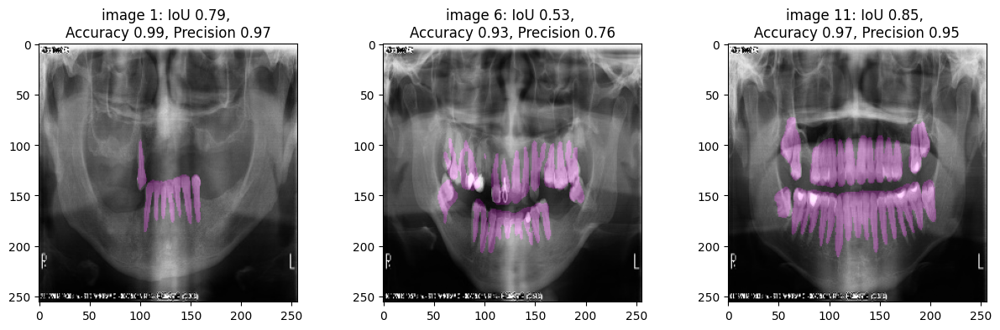

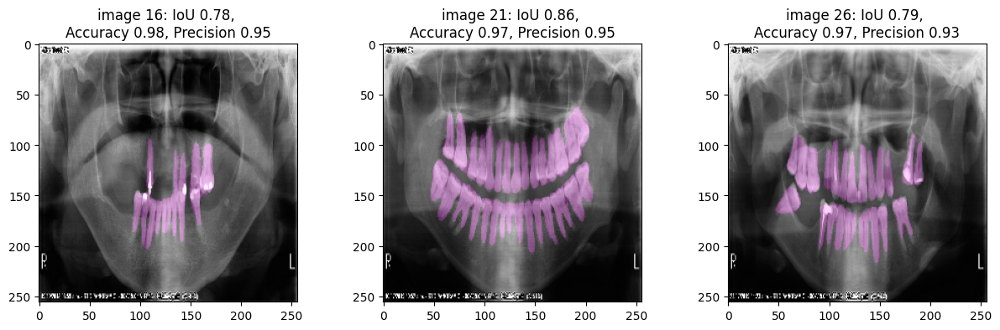

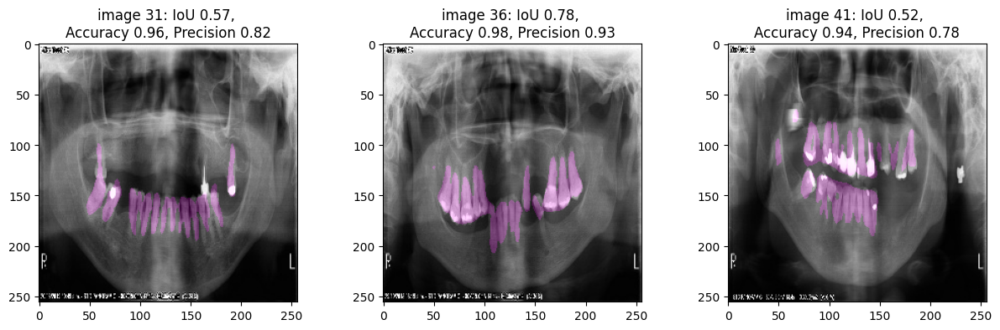

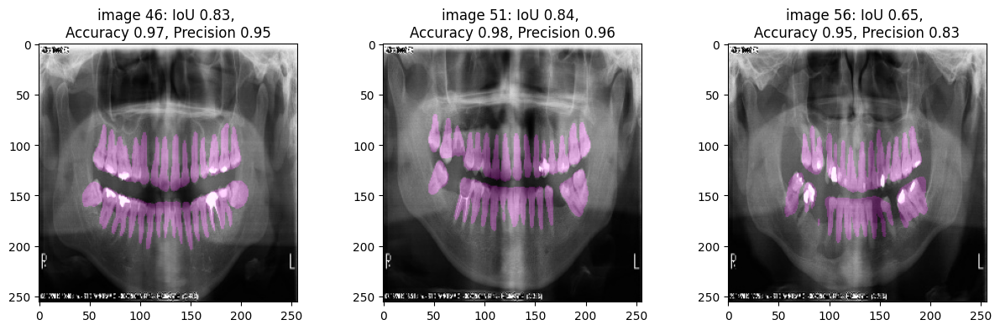

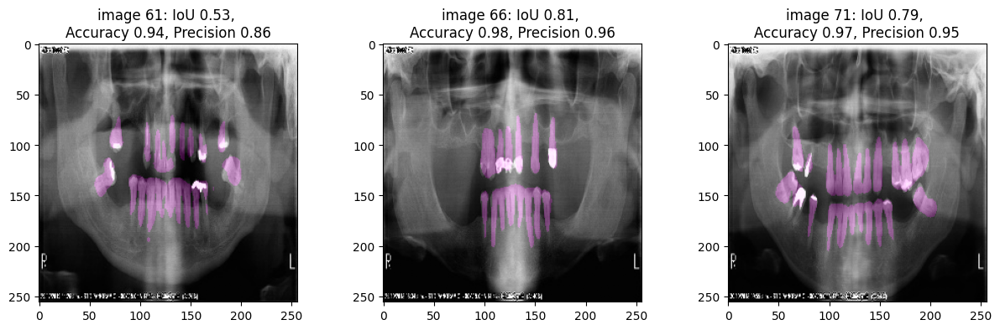

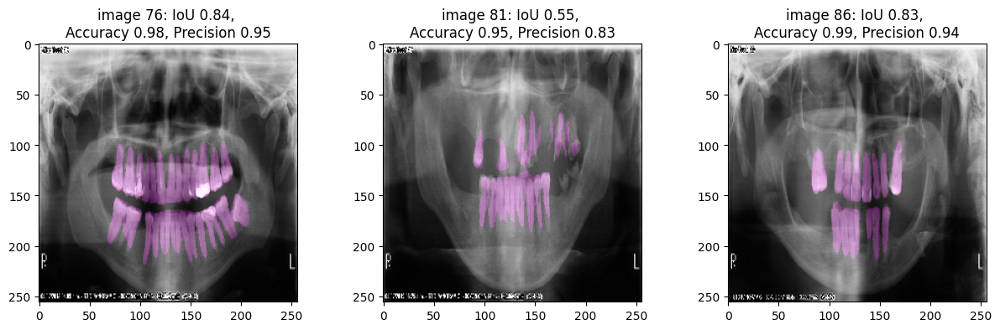

In [ ]:
model = UNet()
baseline_results = eval_test('best_model_baseline.pth')
# append the evaluation results to a Dataframe
baseline_row = {'model': 'baseline: simple UNet', 'IoU': np.mean(baseline_results[3]), 'Accuracy': np.mean(baseline_results[4]), 'Precision': np.mean(baseline_results[5])}
results_models = pd.concat([results_models, pd.DataFrame([baseline_row])], ignore_index=True)
# display every fifth images
idx_lst = [i*5 for i in range(len(baseline_results[5])//5)]
display_overlap(idx_lst, baseline_results)

Result interpretation:
-   The model could detect the teeth in the image with high accuracy and precision, and slightly lower IoU.
-   The prediction on the background is very accurate.
-   The model could detect the teeth crown and neck very well, but the deep parts of the roots are often not detected. This is because the pixel values of the deep roots are very close to the background.

## 3.5 UNet with efficientnet_b4

use pretrained model efficientnet-b4 as encoder of UNet

### 3.5.1 Small dataset to test model learning efficiency
test threshold 0.2, 0.5, 0.8 for pixel values, when pixel value > threshold, pixel value = 1, else 0

Create sweep with ID: b9kd2co6
Sweep URL: https://wandb.ai/weiping-zhang/dlbs/sweeps/b9kd2co6


wandb: Agent Starting Run: tklztnd2 with config:
wandb: 	batch_size: 64
wandb: 	data_type: small
wandb: 	dropout_rate: 0
wandb: 	early_stop_epochs: 15
wandb: 	early_stop_threshold: 0.99
wandb: 	epochs: 200
wandb: 	learning_rate: 0.001
wandb: 	model: UNet_efficientnet_b4
wandb: 	pred_threshold: 0.8
wandb: 	regularization_strength: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Loaded pretrained weights for efficientnet-b4


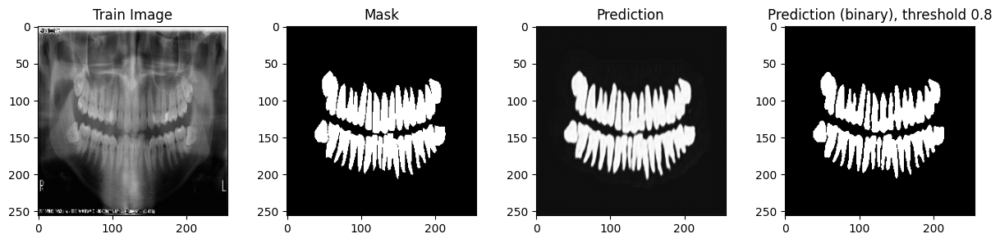

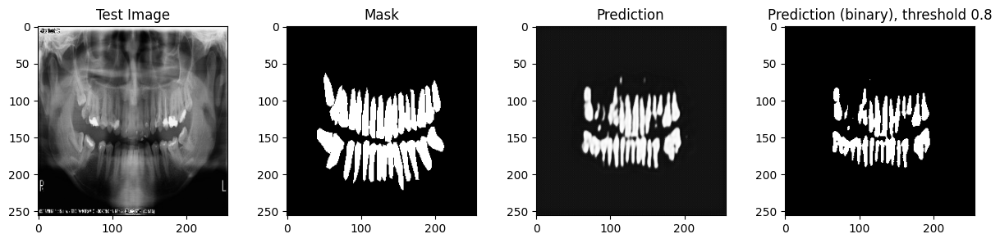

Train Accuracy,▁▂▂▂▂▂▂▂▂▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▇▆▇▇▇▇▇▇██████
Train IoU,▁▂▂▂▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇████
Train Loss,█▇▆▆▆▅▅▅▅▅▄▄▄▄▄▄▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁
Train Precision,▁▂▂▂▂▂▂▂▂▃▃▃▄▄▄▄▄▄▅▅▅▅▅▆▆▆▇▆▇▇▇▇▇▇██████
Valid Accuracy,▁▁▁▁▁▁▁▁▅▇▅▄▁▁▂▁▁▁▁▂▂▅▇▆▅▃▅▇▇█▇▇▇▇▇▇▇▇██
Valid IoU,▁▁▁▁▁▁▁▁▅█▅▄▂▁▂▁▁▁▁▂▂▄▇▆▅▃▅▇▇▇▇▇▇▇▇▇▇▇██
Valid Loss,██▇▆▅▅▄▄▃▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Valid Precision,████▂█▃█▂▁▁▂▁█▂▄▄▄▇▅▄▄▃▃▃▃▃▃▂▂▂▂▃▂▂▂▂▂▂▂
Train Accuracy,0.98781
Train IoU,0.87968
Train Loss,0.03304


wandb: Agent Starting Run: imbe58rb with config:
wandb: 	batch_size: 64
wandb: 	data_type: small
wandb: 	dropout_rate: 0
wandb: 	early_stop_epochs: 15
wandb: 	early_stop_threshold: 0.99
wandb: 	epochs: 200
wandb: 	learning_rate: 0.001
wandb: 	model: UNet_efficientnet_b4
wandb: 	pred_threshold: 0.5
wandb: 	regularization_strength: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Loaded pretrained weights for efficientnet-b4


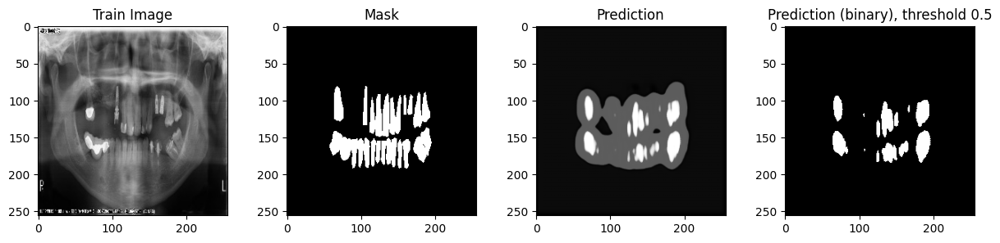

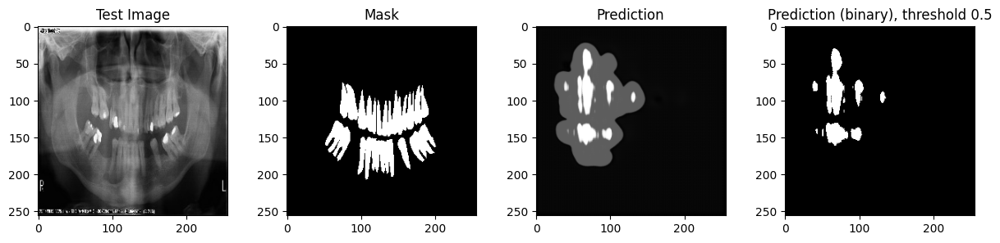

Train Accuracy,▁▇▇▆▇▇▇▇▇██████████████████████████████▇
Train IoU,▁▃▃▂▃▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇█████▂
Train Loss,█▇▆▆▅▅▅▅▅▄▄▄▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▂
Train Precision,▁▇▇▆▇▇▇▇▇██████████████████████████████▇
Valid Accuracy,▄▄▄▄▅▆▄▄▄▄▄▅▄▄▅▆▅▅▅▅▆▅▆▇▆▆▇▆▇▇█▆▆▆▇▇▇▇█▁
Valid IoU,▁▁▁▁▃▅▁▁▁▁▂▃▁▂▂▅▃▃▂▄▄▄▄▆▅▅▆▅▆▆█▅▆▅▆▆▆▆█▃
Valid Loss,▇▆▆▆▅▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▂█
Valid Precision,████▅▅▇▆██▅▆▅▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▅▅▆▆▆▆▆▆▆▁
Train Accuracy,0.91734
Train IoU,0.23941
Train Loss,0.06489


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 5rwudgne with config:
wandb: 	batch_size: 64
wandb: 	data_type: small
wandb: 	dropout_rate: 0
wandb: 	early_stop_epochs: 15
wandb: 	early_stop_threshold: 0.99
wandb: 	epochs: 200
wandb: 	learning_rate: 0.001
wandb: 	model: UNet_efficientnet_b4
wandb: 	pred_threshold: 0.2
wandb: 	regularization_strength: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Loaded pretrained weights for efficientnet-b4


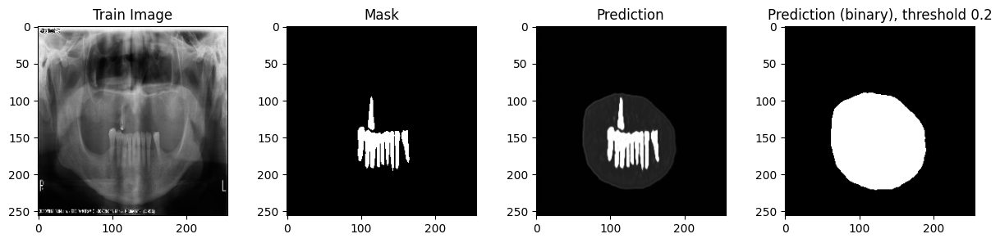

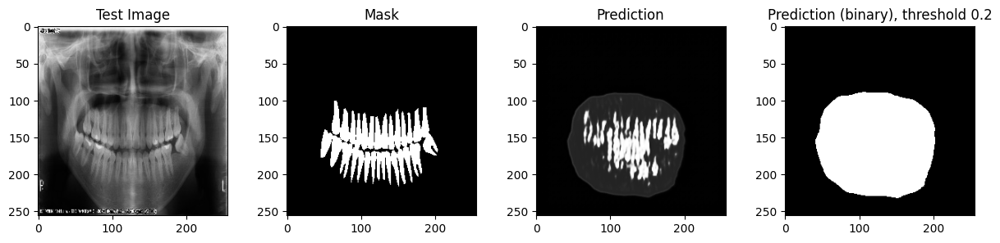

Train Accuracy,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█████
Train IoU,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▇▇███
Train Loss,█▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁
Train Precision,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█████
Valid Accuracy,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█████
Valid IoU,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▇▇▇██
Valid Loss,███▇▇▇▆▆▆▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁
Valid Precision,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▇▇▇██
Train Accuracy,0.73928
Train IoU,0.28117
Train Loss,0.044


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.


In [55]:
# UNet_efficientnet_b4 + small set
torch.autograd.set_detect_anomaly(True)
config = {
    'method': 'grid',
    'metric': {'name': 'Train Loss', 'goal': 'minimize'},
    'parameters': {
        'model': {'values': ['UNet_efficientnet_b4']}, # model type: UNet, UNet_efficientnet_b4
        'data_type': {'values': ['small']}, # data type: small, other
        'pred_threshold': {'values': [0.8,0.5,0.2]}, # prediction threshold: pixel value > threshold -> 1, else 0
        'batch_size': {'values': [64]}, 
        'learning_rate': {'values': [0.001]}, 
        'epochs': {'values': [200]},
        'early_stop_epochs': {'values': [15]},
        'early_stop_threshold': {'values': [0.99]},
        'dropout_rate': {'values': [0]},
        'regularization_strength': {'values': [0]},  
        'saved_model_name':{'values': ['test_best_model.pth']}
    }}

sweep_id = wandb.sweep(config, project="dlbs", entity="weiping-zhang")
wandb.agent(sweep_id, function=lambda: train_eval_model(config))

In [272]:
#https://wandb.ai/weiping-zhang/dlbs/sweeps/b9kd2co6/workspace?workspace=user-weiping-zhang

sweep = api.sweep(f"weiping-zhang/dlbs/sweeps/b9kd2co6")
sweep.display(height=512)

True

#### Result interpretation
1. All three models could learn from the small train data
2. With threshold of 0.8, the model reached better IoU, precision, accuray than 0.2 and 0.5, though more epochs are needed to reach minimal loss (flat).
3. From the prediction masks example, threshold 0.8 group could segment all objects, though exact object area size could be slightly different. The segmentations by threshold 0.5 could only detect very small part of objects, by threshold 0.2, a circle with most of objects contained is detected as one object, this is too far away to the truth.


### 3.5.2 Train on full dataset 
With various prediction threshold: 0.8, 0.5, 0.2

In [70]:
# UNet_efficientnet_b4 + weighted loss
torch.autograd.set_detect_anomaly(True)
config = {
    'method': 'grid',
    'metric': {'name': 'Train Loss', 'goal': 'minimize'},
    'parameters': {
        'model': {'values': ['UNet_efficientnet_b4']}, # model type: UNet, UNet_efficientnet_b4
        'data_type': {'values': ['large']}, # data type: small, other
        'pred_threshold': {'values': [0.8,0.5,0.2]}, # prediction threshold
        'batch_size': {'values': [32]}, 
        'learning_rate': {'values': [0.001]}, 
        'epochs': {'values': [50]},
        'early_stop_epochs': {'values': [10]},
        'early_stop_threshold': {'values': [0.99]},
        'dropout_rate': {'values': [0]},
        'regularization_strength': {'values': [0]},  
        'saved_model_name':{'values': ['best_model_1_aug.pth']}
    }}

sweep_id = wandb.sweep(config, project="dlbs", entity="weiping-zhang")
wandb.agent(sweep_id, function=lambda: train_eval_model(config))

Create sweep with ID: 5hu3xjyq
Sweep URL: https://wandb.ai/weiping-zhang/dlbs/sweeps/5hu3xjyq


wandb: Agent Starting Run: cylyq116 with config:
wandb: 	batch_size: 32
wandb: 	data_type: large
wandb: 	dropout_rate: 0
wandb: 	early_stop_epochs: 10
wandb: 	early_stop_threshold: 0.99
wandb: 	epochs: 50
wandb: 	learning_rate: 0.001
wandb: 	model: UNet_efficientnet_b4
wandb: 	pred_threshold: 0.8
wandb: 	regularization_strength: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Loaded pretrained weights for efficientnet-b4
Early stopping


Train Accuracy,▁▂▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇█▇███▇▇▇███
Train IoU,▁▂▄▄▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇█████▇▇▇███
Train Loss,█▆▅▅▄▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train Precision,▁▂▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇█▇███▇▇▇███
Valid Accuracy,▁▅▁▃▅▅▇▆▆▇▆▇▇▇▆▇▇██▇▇███████▇▇▇██
Valid IoU,▁▅▁▃▄▄█▇▇████▇█████▇▇█▇█████▇▇▆██
Valid Loss,█▅▅▄▄▃▃▂▃▂▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Valid Precision,▇▆██▇▇▄▅▃▄▁▃▂▄▁▂▄▄▆▇▅▅▆▆▅▇▅▅▆▇█▇▇
Train Accuracy,0.92928
Train IoU,0.54469
Train Loss,0.02123


wandb: Agent Starting Run: pelanrx6 with config:
wandb: 	batch_size: 32
wandb: 	data_type: large
wandb: 	dropout_rate: 0
wandb: 	early_stop_epochs: 10
wandb: 	early_stop_threshold: 0.99
wandb: 	epochs: 50
wandb: 	learning_rate: 0.001
wandb: 	model: UNet_efficientnet_b4
wandb: 	pred_threshold: 0.5
wandb: 	regularization_strength: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Loaded pretrained weights for efficientnet-b4
Early stopping


Train Accuracy,▁▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇█▇▇▇▇████▇██▇███
Train IoU,▁▃▁▂▂▃▃▁▃▅▅▄▅▃▄▄▄▆▇▆▄▄▅▇▇▇▆▅▇█▆▇██
Train Loss,█▆▆▅▄▄▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train Precision,▁▅▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇█▇▇▇▇████▇██▇███
Valid Accuracy,▁▇▇▆▇▇▇▅▇▇██▇▇█▇██▇█▇▇████████████
Valid IoU,▁▅▂▂▆▆▆▅▇▅▇▇▄▆█▆▇▇▆▆▇▆███▇██▇▇▇▇▇▇
Valid Loss,█▅▅▄▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁
Valid Precision,▁▅▇▇▆▆▅▄▆▇▆▇▆▅▆▆▆▇▇█▆▇▇▇█▇▇▇██▇███
Train Accuracy,0.9386
Train IoU,0.61007
Train Loss,0.02117


wandb: Agent Starting Run: 12pf2ub4 with config:
wandb: 	batch_size: 32
wandb: 	data_type: large
wandb: 	dropout_rate: 0
wandb: 	early_stop_epochs: 10
wandb: 	early_stop_threshold: 0.99
wandb: 	epochs: 50
wandb: 	learning_rate: 0.001
wandb: 	model: UNet_efficientnet_b4
wandb: 	pred_threshold: 0.2
wandb: 	regularization_strength: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Loaded pretrained weights for efficientnet-b4
Early stopping


Train Accuracy,▁▃▆▇██████████████████████████
Train IoU,▁▂▅▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇█████▇██████
Train Loss,█▆▅▄▄▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
Train Precision,▁▃▆▇██████████████████████████
Valid Accuracy,▁▆▇███████████████████████████
Valid IoU,▁▄▆▇▆▇▇▇▇▇█▇▇█▇▇▇████████▇▇███
Valid Loss,█▅▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
Valid Precision,▁▃▅▅▆▆▆▆▆▆▆▇▇▇▇▇▆▆▇▇▇▇▇▇██████
Train Accuracy,0.94069
Train IoU,0.63019
Train Loss,0.02118


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.


In [273]:
# https://wandb.ai/weiping-zhang/dlbs/sweeps/5hu3xjyq/workspace?workspace=user-weiping-zhang
%wandb weiping-zhang/dlbs/sweeps/5hu3xjyq -h 512

Result interpretaion:
-   The three models have very similar results. This is because the model itself might be robust to the changes in threshold. A robust model can provide consistent and reliable predictions across different threshold values, which could lead to similar IoU values for a range of thresholds.
-   In the model with threshold of 0.2, less epochs are needed to reach high performance.

### 3.5.3 Tune batch size & learning rate

Create sweep with ID: kaeaemdn
Sweep URL: https://wandb.ai/weiping-zhang/dlbs/sweeps/kaeaemdn


wandb: Agent Starting Run: bs47anzr with config:
wandb: 	batch_size: 16
wandb: 	data_type: large
wandb: 	dropout_rate: 0
wandb: 	early_stop_epochs: 10
wandb: 	early_stop_threshold: 0.99
wandb: 	epochs: 50
wandb: 	learning_rate: 0.1
wandb: 	model: UNet_efficientnet_b4
wandb: 	pred_threshold: 0.2
wandb: 	regularization_strength: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: weiping-zhang. Use `wandb login --relogin` to force relogin


Loaded pretrained weights for efficientnet-b4
Early stopping


Train Accuracy,▁█████████
Train IoU,█▁▁▁▁▁▁▁▁▁
Train Loss,█▁▁▁▁▁▁▁▁▁
Train Precision,▁█████████
Valid Accuracy,▁▁▁▁▁▁▁▁▁▁
Valid IoU,▁▁▁▁▁▁▁▁▁▁
Valid Loss,▁▁▁▂█▂▂▁▁▁
Valid Precision,▁▁▁▁▁▁▁▁▁▁
Train Accuracy,0.85093
Train IoU,0.0
Train Loss,0.04297


wandb: Agent Starting Run: p7k2epae with config:
wandb: 	batch_size: 16
wandb: 	data_type: large
wandb: 	dropout_rate: 0
wandb: 	early_stop_epochs: 10
wandb: 	early_stop_threshold: 0.99
wandb: 	epochs: 50
wandb: 	learning_rate: 0.01
wandb: 	model: UNet_efficientnet_b4
wandb: 	pred_threshold: 0.2
wandb: 	regularization_strength: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Loaded pretrained weights for efficientnet-b4
Early stopping


Train Accuracy,▁█████████
Train IoU,█▄▁▁▁▁▁▁▁▁
Train Loss,█▁▁▁▁▁▁▁▁▁
Train Precision,▁█████████
Valid Accuracy,▁▁▁▁▁▁▁▁▁▁
Valid IoU,▁▁▁▁▁▁▁▁▁▁
Valid Loss,▁▄██▆▅▃▁▁▁
Valid Precision,▁▁▁▁▁▁▁▁▁▁
Train Accuracy,0.85093
Train IoU,0.0
Train Loss,0.04297


wandb: Agent Starting Run: ggzhmuol with config:
wandb: 	batch_size: 16
wandb: 	data_type: large
wandb: 	dropout_rate: 0
wandb: 	early_stop_epochs: 10
wandb: 	early_stop_threshold: 0.99
wandb: 	epochs: 50
wandb: 	learning_rate: 0.001
wandb: 	model: UNet_efficientnet_b4
wandb: 	pred_threshold: 0.2
wandb: 	regularization_strength: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Loaded pretrained weights for efficientnet-b4
Early stopping


Train Accuracy,▁▂▇██████████████████████████
Train IoU,▁▁▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇█▇▇██▇▇█████
Train Loss,█▆▅▄▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train Precision,▁▂▇██████████████████████████
Valid Accuracy,▁▂███████████████████████████
Valid IoU,▁▁▆▇▇▇▇█▇█▇█▇▇▇█▇████▇▇████▇▇
Valid Loss,█▆▅▄▃▃▂▂▂▂▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Valid Precision,▁▁▅▆▆▆▇▇▆▇▇█▇█▇▇▇▇▇▇███▇▇▇███
Train Accuracy,0.94364
Train IoU,0.64922
Train Loss,0.04144


wandb: Agent Starting Run: x60mo1ql with config:
wandb: 	batch_size: 16
wandb: 	data_type: large
wandb: 	dropout_rate: 0
wandb: 	early_stop_epochs: 10
wandb: 	early_stop_threshold: 0.99
wandb: 	epochs: 50
wandb: 	learning_rate: 0.0001
wandb: 	model: UNet_efficientnet_b4
wandb: 	pred_threshold: 0.2
wandb: 	regularization_strength: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Loaded pretrained weights for efficientnet-b4


wandb: ERROR Error while calling W&B API: context deadline exceeded (<Response [500]>)
wandb: Network error (ReadTimeout), entering retry loop.
wandb: ERROR Error while calling W&B API: context deadline exceeded (<Response [500]>)
wandb: ERROR Error while calling W&B API: context deadline exceeded (<Response [500]>)
wandb: Network error (HTTPError), entering retry loop.


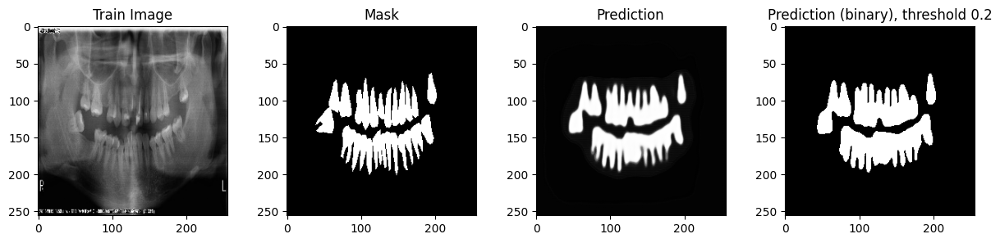

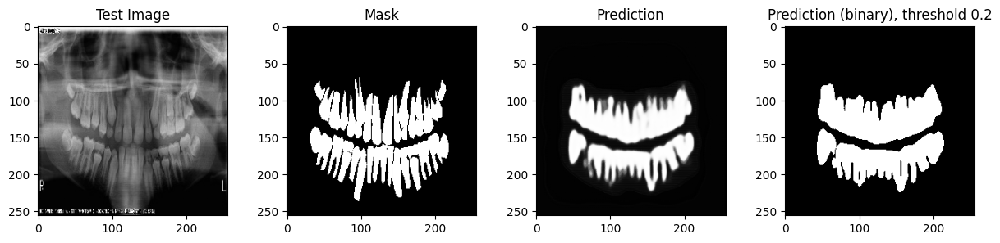

Train Accuracy,▁▁▁▁▁▁▁▁▄▆▆▆▆▆▆▆▆▇▇▇▇▇██████████████████
Train IoU,▁▁▁▁▁▁▁▁▂▃▃▃▃▃▃▃▃▄▄▄▅▆▆▆▇▇▇▇▇▇▇▇▇▇██████
Train Loss,█▇▆▆▆▅▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁
Train Precision,▁▁▁▁▁▁▁▁▄▆▆▆▆▆▆▆▆▇▇▇▇▇██████████████████
Valid Accuracy,▁▁▁▁▁▁▁▁▆▆▇▆▇▇▇▆▇▇▇▇████████████████████
Valid IoU,▁▁▁▁▁▁▁▁▄▄▄▄▅▅▅▄▅▆▆▅▇███▇██████▇█▇▇█▇█▇█
Valid Loss,███▇▇▆▆▆▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁
Valid Precision,▁▁▁▁▁▁▁▁▃▃▄▃▄▄▄▃▄▅▅▄▆▆▆▇▆▇▇▇▇▇██▇███▇███
Train Accuracy,0.9623
Train IoU,0.77784
Train Loss,0.04241


wandb: Agent Starting Run: xqjbspqj with config:
wandb: 	batch_size: 32
wandb: 	data_type: large
wandb: 	dropout_rate: 0
wandb: 	early_stop_epochs: 10
wandb: 	early_stop_threshold: 0.99
wandb: 	epochs: 50
wandb: 	learning_rate: 0.1
wandb: 	model: UNet_efficientnet_b4
wandb: 	pred_threshold: 0.2
wandb: 	regularization_strength: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Loaded pretrained weights for efficientnet-b4
Early stopping


Train Accuracy,▁█████████
Train IoU,█▁▁▁▁▁▁▁▁▁
Train Loss,█▁▁▁▁▁▁▁▁▁
Train Precision,▁█████████
Valid Accuracy,▁▁▁▁▁▁▁▁▁▁
Valid IoU,▁▁▁▁▁▁▁▁▁▁
Valid Loss,▁▁▁▁▁▁█▁▁▁
Valid Precision,▁▁▁▁▁▁▁▁▁▁
Train Accuracy,0.85093
Train IoU,0.0
Train Loss,0.02189


wandb: Agent Starting Run: qvv7n0ex with config:
wandb: 	batch_size: 32
wandb: 	data_type: large
wandb: 	dropout_rate: 0
wandb: 	early_stop_epochs: 10
wandb: 	early_stop_threshold: 0.99
wandb: 	epochs: 50
wandb: 	learning_rate: 0.01
wandb: 	model: UNet_efficientnet_b4
wandb: 	pred_threshold: 0.2
wandb: 	regularization_strength: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Loaded pretrained weights for efficientnet-b4
Early stopping


Train Accuracy,▁███████▇██
Train IoU,▄▇▇▇████▁▅▇
Train Loss,█▂▁▁▁▁▁▁▂▁▁
Train Precision,▁███████▇██
Valid Accuracy,▁▁▆██████▇█
Valid IoU,▃▃▅▇▇▇█▇▁▇▇
Valid Loss,██▃▁▁▁▁▁▁▂▁
Valid Precision,▁▁▂▄▅▄▅▅█▄▅
Train Accuracy,0.91148
Train IoU,0.45228
Train Loss,0.02153


wandb: Agent Starting Run: bgu15t81 with config:
wandb: 	batch_size: 32
wandb: 	data_type: large
wandb: 	dropout_rate: 0
wandb: 	early_stop_epochs: 10
wandb: 	early_stop_threshold: 0.99
wandb: 	epochs: 50
wandb: 	learning_rate: 0.001
wandb: 	model: UNet_efficientnet_b4
wandb: 	pred_threshold: 0.2
wandb: 	regularization_strength: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Loaded pretrained weights for efficientnet-b4
Early stopping


Train Accuracy,▁▁▁▁▁▃▇▇▇▇▇█████████████████████
Train IoU,▁▁▁▁▁▂▅▅▆▆▆▇▇▇▇█▇▇██████████▇██▇
Train Loss,█▇▆▆▅▅▄▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train Precision,▁▁▁▁▁▃▇▇▇▇▇█████████████████████
Valid Accuracy,▁▁▁▁▁▆▄▇▇▇▇██▇██████████████████
Valid IoU,▁▁▁▁▁▄▂▅▆▆▆▇▇▆▇▇▇██▇█▇████████▇█
Valid Loss,█▆▆▅▅▄▅▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Valid Precision,▁▁▁▁▁▄▂▅▅▅▅▆▇▅▆▆▆▇███▇▇██▇██▇█▇█
Train Accuracy,0.93239
Train IoU,0.59505
Train Loss,0.0214


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 94b06zsw with config:
wandb: 	batch_size: 32
wandb: 	data_type: large
wandb: 	dropout_rate: 0
wandb: 	early_stop_epochs: 10
wandb: 	early_stop_threshold: 0.99
wandb: 	epochs: 50
wandb: 	learning_rate: 0.0001
wandb: 	model: UNet_efficientnet_b4
wandb: 	pred_threshold: 0.2
wandb: 	regularization_strength: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Loaded pretrained weights for efficientnet-b4


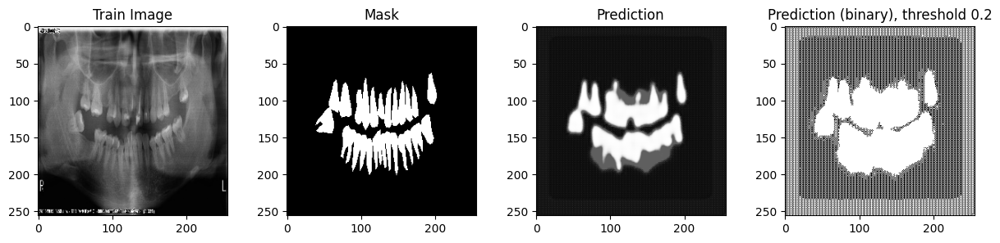

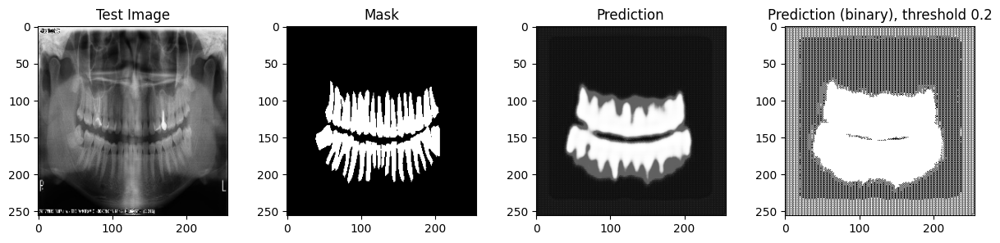

Train Accuracy,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▃▄▄▅▆▆▆▇▇▇██
Train IoU,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▃▃▄▄▅▅▆▆▇▇▇█
Train Loss,█▆▆▅▅▅▅▄▄▄▄▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁
Train Precision,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▃▄▄▅▆▆▆▇▇▇██
Valid Accuracy,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▃▄▄▅▆▆▇▇▇▇▇██
Valid IoU,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▃▃▄▅▅▆▆▆▇▇██
Valid Loss,█▆▅▅▅▅▄▄▄▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
Valid Precision,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▃▃▄▅▅▆▆▆▇▇██
Train Accuracy,0.53203
Train IoU,0.23799
Train Loss,0.02392


wandb: Agent Starting Run: s4sz1l9l with config:
wandb: 	batch_size: 64
wandb: 	data_type: large
wandb: 	dropout_rate: 0
wandb: 	early_stop_epochs: 10
wandb: 	early_stop_threshold: 0.99
wandb: 	epochs: 50
wandb: 	learning_rate: 0.1
wandb: 	model: UNet_efficientnet_b4
wandb: 	pred_threshold: 0.2
wandb: 	regularization_strength: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Loaded pretrained weights for efficientnet-b4
Early stopping


Train Accuracy,▁█████████
Train IoU,█▁▁▁▁▁▁▁▁▁
Train Loss,█▁▁▁▁▁▁▁▁▁
Train Precision,▁█████████
Valid Accuracy,▁▁▁▁▁▁▁▁▁▁
Valid IoU,▁▁▁▁▁▁▁▁▁▁
Valid Loss,▁▁▁▁▁▁▁▁▂█
Valid Precision,▁▁▁▁▁▁▁▁▁▁
Train Accuracy,0.85093
Train IoU,0.0
Train Loss,0.01135


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: ysliaiy9 with config:
wandb: 	batch_size: 64
wandb: 	data_type: large
wandb: 	dropout_rate: 0
wandb: 	early_stop_epochs: 10
wandb: 	early_stop_threshold: 0.99
wandb: 	epochs: 50
wandb: 	learning_rate: 0.01
wandb: 	model: UNet_efficientnet_b4
wandb: 	pred_threshold: 0.2
wandb: 	regularization_strength: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Loaded pretrained weights for efficientnet-b4
Early stopping


Train Accuracy,▁▇▇▇▇▇▇▇█████████▇▇▇
Train IoU,▃▁▁▁▁▁▁▁▅▆▇▇▇████▂▁▁
Train Loss,█▃▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▂▂▂
Train Precision,▁▇▇▇▇▇▇▇█████████▇▇▇
Valid Accuracy,▇▇▇▇▇▇▇▅▄▁▇▇█████▇▇▇
Valid IoU,▁▁▁▁▁▁▁▂▄▃▁▁▃▇███▁▁▁
Valid Loss,▁▁▁▁▁▁▂▃▅█▁▁▁▁▁▁▁▁▁▁
Valid Precision,█▁█████▂▂▁██▇▆▅▅▅███
Train Accuracy,0.85093
Train IoU,0.0
Train Loss,0.01135


wandb: Agent Starting Run: kyiub98r with config:
wandb: 	batch_size: 64
wandb: 	data_type: large
wandb: 	dropout_rate: 0
wandb: 	early_stop_epochs: 10
wandb: 	early_stop_threshold: 0.99
wandb: 	epochs: 50
wandb: 	learning_rate: 0.001
wandb: 	model: UNet_efficientnet_b4
wandb: 	pred_threshold: 0.2
wandb: 	regularization_strength: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Loaded pretrained weights for efficientnet-b4
Early stopping


Train Accuracy,▁▁▁▁▁▁▁▂▆▇██████████████████████████████
Train IoU,▁▁▁▁▁▁▁▁▃▅▇▇▇▇▇▇▇▇▇▇████▇█▇▇▇▇██████████
Train Loss,█▇▆▆▅▅▅▅▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁
Train Precision,▁▁▁▁▁▁▁▂▆▇██████████████████████████████
Valid Accuracy,▁▁▁▁▁▁▁▁▅▇███▇▇▇▇█▇█████▇███████████████
Valid IoU,▁▁▁▁▁▁▁▁▃▅▇▇▇▆▆▆▆▇▆▆▇███▆▇▇▇████▇▇███▇▇█
Valid Loss,█▇▅▅▄▄▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
Valid Precision,▁▁▁▁▁▁▁▁▂▄▅▆▆▄▅▄▄▅▅▅▆▇▇▆▅▆▆▆▇▆▆▇███▇████
Train Accuracy,0.94094
Train IoU,0.64103
Train Loss,0.01109


wandb: Agent Starting Run: up3qemz0 with config:
wandb: 	batch_size: 64
wandb: 	data_type: large
wandb: 	dropout_rate: 0
wandb: 	early_stop_epochs: 10
wandb: 	early_stop_threshold: 0.99
wandb: 	epochs: 50
wandb: 	learning_rate: 0.0001
wandb: 	model: UNet_efficientnet_b4
wandb: 	pred_threshold: 0.2
wandb: 	regularization_strength: 0
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Loaded pretrained weights for efficientnet-b4
Early stopping


Train Accuracy,▄▁██████████████████████████████
Train IoU,▁▆██████████████████████████████
Train Loss,█▆▅▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
Train Precision,▄▁██████████████████████████████
Valid Accuracy,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Valid IoU,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Valid Loss,█▇▅▄▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁
Valid Precision,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train Accuracy,0.14907
Train IoU,0.14907
Train Loss,0.01288


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.


In [25]:
config['parameters']['pred_threshold']['values'] = [0.2]
config['parameters']['batch_size']['values'] = [16,32,64]
config['parameters']['learning_rate']['values'] = [0.1, 0.01, 0.001, 0.0001]
sweep_id = wandb.sweep(config, project="dlbs", entity="weiping-zhang")
wandb.agent(sweep_id, function=lambda: train_eval_model(config))

In [274]:
# report of the resut
%wandb weiping-zhang/dlbs/reports/UNet_efficientnet_b4_lr_bs--Vmlldzo2MDU5Mjgz -h 512

Result interpretation:

- With the combination of learning rate 0.0001 and batch size 16, the model has the best performance on train set (IoU = 0.78) and it has least fluctuations. The model reaches also very good accuracy and precision.

- Overfitting: However, this model has IoU of 0.59 on validation set. This large difference of IoU(0.19) and precision (0.24) compared to trainset suggests that the model is overfitting.

I will further apply regularization to improve the performance on the validation set by giving up some IoU and precision on train set.

### 3.5.4 Regularization & dropout to improve the overfitting
I will apply 
-   **L2 regularization** which will add a penalty to the loss function to solve the overfitting problem. 
-   **dropout** each neuron with a certain probability. It forces the network to not rely on any single neuron, making the model less sensitive to specific weights of neurons. 
-   start with regularization strength of 0.01, 0.001, 0.0001, dropout rate of 0, 0.2, 0.5, 0.8.

In [ ]:
config = {
    'method': 'grid',
    'metric': {'name': 'Train Loss', 'goal': 'minimize'},
    'parameters': {
        'model': {'values': ['UNet_efficientnet_b4']}, # model type: simple_UNet, UNet, UNet_efficientnet_b4
        'data_type': {'values': ['large']}, # data type: small, other
        'pred_threshold': {'values': [0.2]}, # prediction threshold
        'batch_size': {'values': [16]}, 
        'learning_rate': {'values': [0.0001]}, 
        'epochs': {'values': [150]},
        'early_stop_epochs': {'values': [15]},
        'early_stop_threshold': {'values': [0.99]},
        'dropout_rate': {'values': [0, 0.2, 0.5, 0.8]},
        'regularization_strength': {'values': [0.01, 0.001, 0.0001]},  
        'saved_model_name':{'values': ['best_model_1_aug.pth']}
    }}

sweep_id = wandb.sweep(config, project="dlbs", entity="weiping-zhang")
wandb.agent(sweep_id, function=lambda: train_eval_model(config))

Create sweep with ID: fmpvuvcr
Sweep URL: https://wandb.ai/weiping-zhang/dlbs/sweeps/fmpvuvcr


wandb: Agent Starting Run: o2s1shka with config:
wandb: 	batch_size: 16
wandb: 	data_type: large
wandb: 	dropout_rate: 0
wandb: 	early_stop_epochs: 15
wandb: 	early_stop_threshold: 0.99
wandb: 	epochs: 150
wandb: 	learning_rate: 0.0001
wandb: 	model: UNet_efficientnet_b4
wandb: 	pred_threshold: 0.2
wandb: 	regularization_strength: 0.01
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Loaded pretrained weights for efficientnet-b4
Early stopping


Train Accuracy,▁▁▁▁▁▁▂▂▄▅▆▇▇▇██████████████████████████
Train IoU,▁▁▁▁▁▁▁▁▂▃▃▅▅▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇████████
Train Loss,█▇▅▅▅▄▄▄▄▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
Train Precision,▁▁▁▁▁▁▂▂▄▅▆▇▇▇██████████████████████████
Valid Accuracy,▁▁▁▁▁▁▁▁▁▁▁▁▁▃▅▄▁▇▇▇▇█▇███▇▇█▇██████████
Valid IoU,▃▃▃▃▃▃▃▃▃▃▃▃▃▃▂▃▃▁▁▂▆▆▂▆▅▇▁▂▄▁▃▆█▆▇███▇█
Valid Loss,▄▄▄▄▄▄▄▄▃▃▃▃▂▂▂▂█▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
Valid Precision,▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▃▅▆▃▆▆▆▁▆▇█▇▇▇▇▇▇▇▇▇▆
Train Accuracy,0.9355
Train IoU,0.64711
Train Loss,0.04398


wandb: Agent Starting Run: d61lnv1n with config:
wandb: 	batch_size: 16
wandb: 	data_type: large
wandb: 	dropout_rate: 0
wandb: 	early_stop_epochs: 15
wandb: 	early_stop_threshold: 0.99
wandb: 	epochs: 150
wandb: 	learning_rate: 0.0001
wandb: 	model: UNet_efficientnet_b4
wandb: 	pred_threshold: 0.2
wandb: 	regularization_strength: 0.001
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Loaded pretrained weights for efficientnet-b4
Early stopping


Train Accuracy,▁▁▁▁▁▁▂▄▅▆▇█████████████████████████████
Train IoU,▁▁▁▁▁▁▁▂▃▄▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇██▇████████
Train Loss,█▆▆▆▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
Train Precision,▁▁▁▁▁▁▂▄▅▆▇█████████████████████████████
Valid Accuracy,▁▁▁▁▁▁▃▃▆▇██████████████████████████████
Valid IoU,▁▁▁▁▁▁▂▂▃▆▆▇▆▆▇▆▅▆▇▅▆▃▆▃▅▆▄▆▆▅▄▆█▇██████
Valid Loss,█▇▆▆▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▃▂▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
Valid Precision,▁▁▁▁▁▁▁▂▃▅▆▆▆▇▆▇▇▇▇▇▇█▇█▇██▇████▇█▇▇█▇▇▇
Train Accuracy,0.94808
Train IoU,0.69926
Train Loss,0.04254


wandb: Agent Starting Run: n4jsjret with config:
wandb: 	batch_size: 16
wandb: 	data_type: large
wandb: 	dropout_rate: 0
wandb: 	early_stop_epochs: 15
wandb: 	early_stop_threshold: 0.99
wandb: 	epochs: 150
wandb: 	learning_rate: 0.0001
wandb: 	model: UNet_efficientnet_b4
wandb: 	pred_threshold: 0.2
wandb: 	regularization_strength: 0.0001
Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.


Loaded pretrained weights for efficientnet-b4


In [268]:
%wandb weiping-zhang/dlbs/reports/dropout-l2-regularization--Vmlldzo2MDgxMjcy -h 1024

Result interpretation:

With regularization strength of 0.0001 and dropout rate of 0.5, the model has the best IoU on validataion set. The difference between train and validation sets are improved.

Now recap the model without regularization from the last step.

In [3]:
%wandb weiping-zhang/dlbs/reports/regularization-dropout-0-5-l2-0-0001--Vmlldzo2NTI1OTU1 -h 512

In the upper report, we can see that the model with dropout rate 0.5 and l2 regularization strength 0.0001 (green) has improved the overfitting problem compared to the model before regularization (purple): better validation IoU and precision, and smaller gap between training and validation set.

### 3.5.5 Optimal UNet-efficientnet-b4 model with 1 x augmentation

Create sweep with ID: yuyywxvr
Sweep URL: https://wandb.ai/weiping-zhang/dlbs/sweeps/yuyywxvr


wandb: Agent Starting Run: 9cdlb05u with config:
wandb: 	batch_size: 16
wandb: 	data_type: large
wandb: 	dropout_rate: 0.5
wandb: 	early_stop_epochs: 50
wandb: 	early_stop_threshold: 0.999
wandb: 	epochs: 150
wandb: 	learning_rate: 0.0001
wandb: 	model: UNet_efficientnet_b4
wandb: 	pred_threshold: 0.2
wandb: 	regularization_strength: 0.0001


Loaded pretrained weights for efficientnet-b4


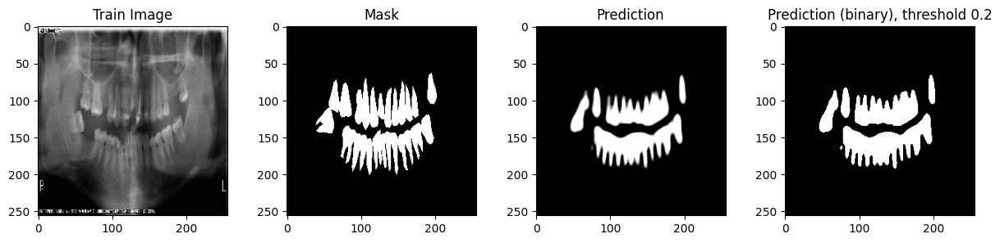

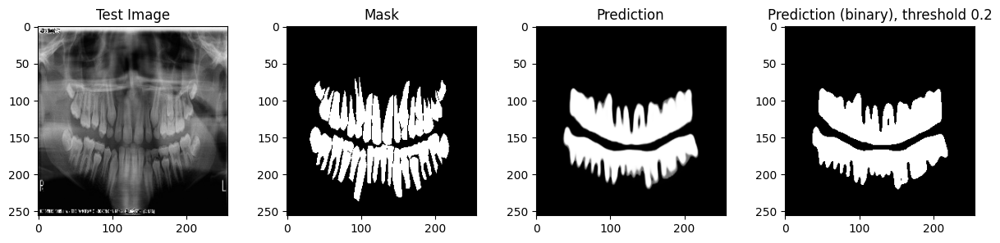

Train Accuracy,▁▁▁▃▃███████████████████████████████████
Train IoU,▁▁▁▂▃▇▇████████████▇▇███████████████████
Train Loss,█▇▆▅▅▄▄▃▃▃▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train Precision,▁▁▁▃▃███████████████████████████████████
Valid Accuracy,▁▁▁▁▃███████████████████████████████████
Valid IoU,▁▁▁▁▁▇▇▇▇▇▆▇▇▇▇▇▇▇▇▇▆▇▇▇▇▇▇██▇▇██▇▇▇████
Valid Loss,██▇▆▆▄▄▃▃▃▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Valid Precision,▁▁▁▁▁▇▇██▇█▇▇▇███████▇██████▇███████████
Train Accuracy,0.94626
Train IoU,0.66735
Train Loss,0.04142


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.


In [58]:
# Sweep URL: https://wandb.ai/weiping-zhang/dlbs/sweeps/yuyywxvr
config = {
    'method': 'grid',
    'metric': {'name': 'Train Loss', 'goal': 'minimize'},
    'parameters': {
        'model': {'values': ['UNet_efficientnet_b4']}, 
        'data_type': {'values': ['large']}, # data type: small, other
        'pred_threshold': {'values': [0.2]}, # prediction threshold
        'batch_size': {'values': [16]}, 
        'learning_rate': {'values': [0.0001]}, 
        'epochs': {'values': [150]},
        'early_stop_epochs': {'values': [50]},
        'early_stop_threshold': {'values': [0.999]},
        'dropout_rate': {'values': [0.5]},
        'regularization_strength': {'values': [0.0001]},  
        'saved_model_name':{'values': ['best_model_1_aug.pth']}
    }}

sweep_id = wandb.sweep(config, project="dlbs", entity="weiping-zhang")
wandb.agent(sweep_id, function=lambda: train_eval_model(config))

In [280]:
# https://wandb.ai/weiping-zhang/dlbs/sweeps/yuyywxvr/workspace?workspace=user-weiping-zhang
%wandb weiping-zhang/dlbs/sweeps/yuyywxvr -h 512

### 3.5.6 Testset evaluation
evaluate the testset by the upper trained optimal model

Loaded pretrained weights for efficientnet-b4


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Test Loss: 0.0432, Test IoU: 0.6470, Test Accuracy: 0.9492, Test Precision: 0.8530


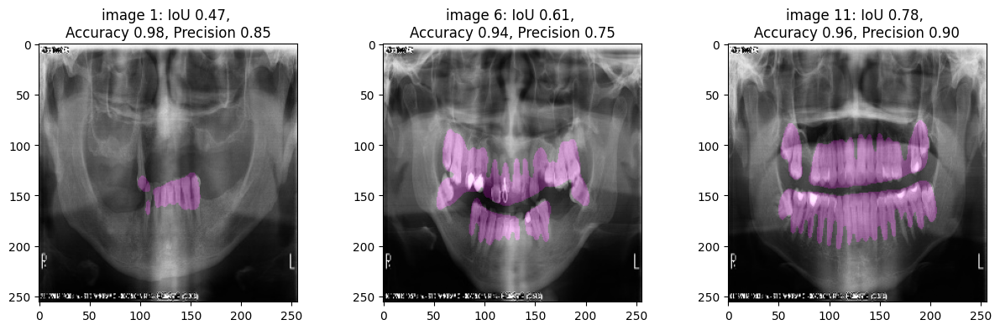

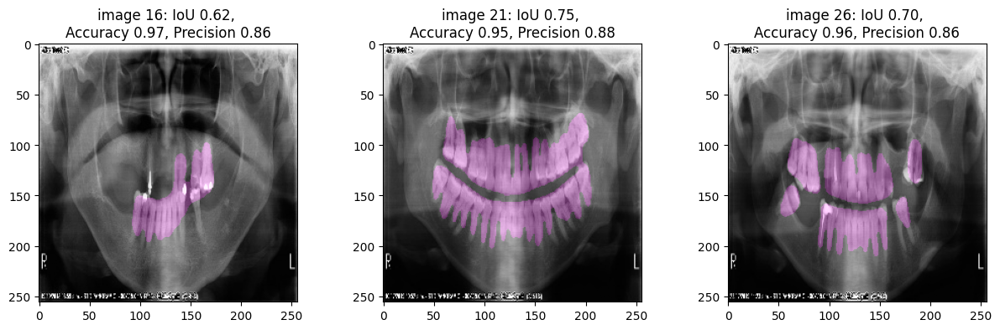

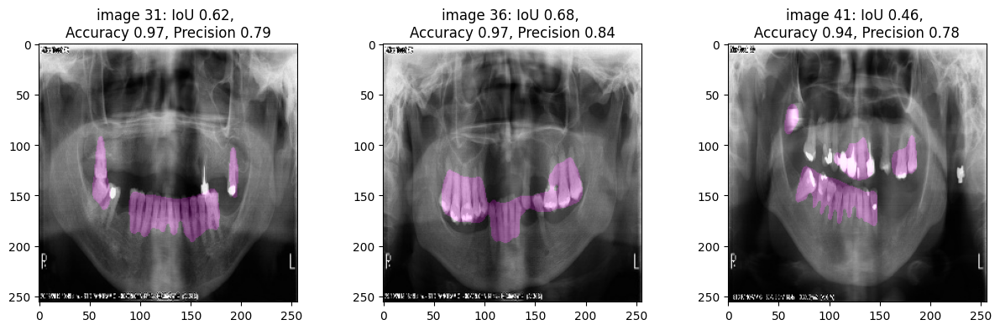

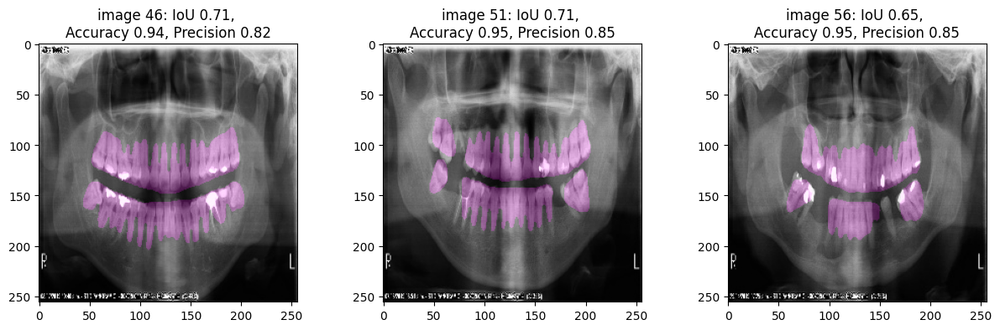

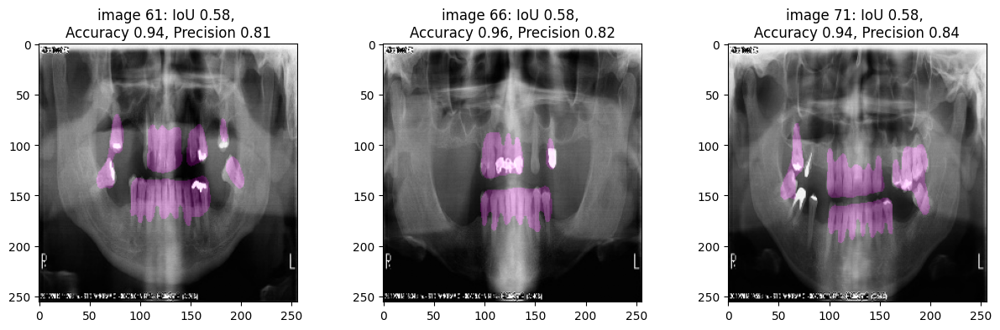

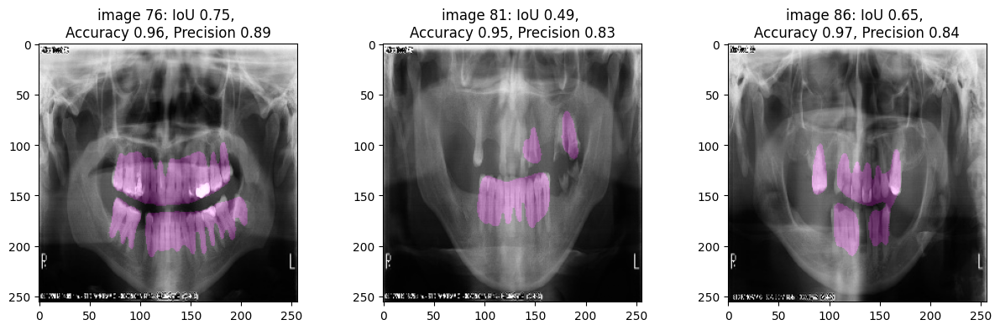

In [259]:
model = UNet_efficientnet_b4()
b4_1aug_results = eval_test('best_model_1_aug.pth')
# append the evaluation results to Dataframe
b4_1aug_row = {'model': 'UNet-efficient-b4 1-aug', 'IoU': np.mean(b4_1aug_results[3]), 'Accuracy': np.mean(b4_1aug_results[4]), 'Precision': np.mean(b4_1aug_results[5])}
results_models = pd.concat([results_models, pd.DataFrame([b4_1aug_row])], ignore_index=True)
# display every fifth images
idx_lst = [i*5 for i in range(len(b4_1aug_results[5])//5)]
display_overlap(idx_lst, b4_1aug_results)

Result interpretation:

-   In the upper image and predicted mask pairs, most of the teeth could be detected.
-   Usually teeth crown and neck could be accurately predicted.
-   Most of the teeth deep roots could not be recognized, as the pixel values are too close to the background.
-   Very few teeth were not detected at all. 

### 3.5.7 Apply 5x Augmentation and train
The upper results show that, the performance of baseline U-Net model is much better than the U-Net with pretrained encoder.
I would like to see how much performance of U-Net with pretrained encoder will be improved when applying 5 x augmentation. This means, each image in training set will get 5 augmented images.

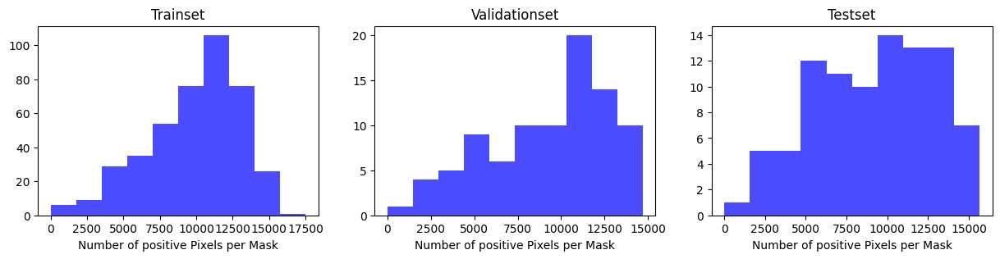

There are 2508 images in Trainset, 89 images in Validationset, 91 images in testset


In [53]:
split_aug_data(dir_lst, 5)

In [25]:
custom_dataset_train = CustomSegmentationDataset(train_img, train_mask, train_ann, transform=transform)

Create sweep with ID: w4ne64oj
Sweep URL: https://wandb.ai/weiping-zhang/dlbs/sweeps/w4ne64oj


wandb: Agent Starting Run: 7hps1oua with config:
wandb: 	batch_size: 16
wandb: 	data_type: large
wandb: 	dropout_rate: 0.5
wandb: 	early_stop_epochs: 50
wandb: 	early_stop_threshold: 0.999
wandb: 	epochs: 150
wandb: 	learning_rate: 0.0001
wandb: 	model: UNet_efficientnet_b4
wandb: 	pred_threshold: 0.2
wandb: 	regularization_strength: 0.0001
wandb: Currently logged in as: weiping-zhang. Use `wandb login --relogin` to force relogin


Loaded pretrained weights for efficientnet-b4


wandb: ERROR Error while calling W&B API: An internal error occurred. Please contact support. (<Response [500]>)
wandb: ERROR Error while calling W&B API: An internal error occurred. Please contact support. (<Response [500]>)
wandb: ERROR Error while calling W&B API: An internal error occurred. Please contact support. (<Response [500]>)
wandb: Network error (HTTPError), entering retry loop.
wandb: ERROR Error while calling W&B API: An internal error occurred. Please contact support. (<Response [500]>)
wandb: ERROR Error while calling W&B API: An internal error occurred. Please contact support. (<Response [500]>)
wandb: ERROR Error while calling W&B API: An internal error occurred. Please contact support. (<Response [500]>)
wandb: ERROR Error while calling W&B API: An internal error occurred. Please contact support. (<Response [500]>)
wandb: Network error (HTTPError), entering retry loop.
wandb: ERROR Error while calling W&B API: An internal error occurred. Please contact support. (<Res

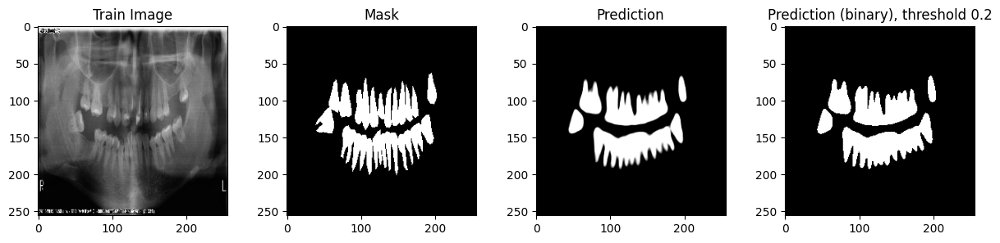

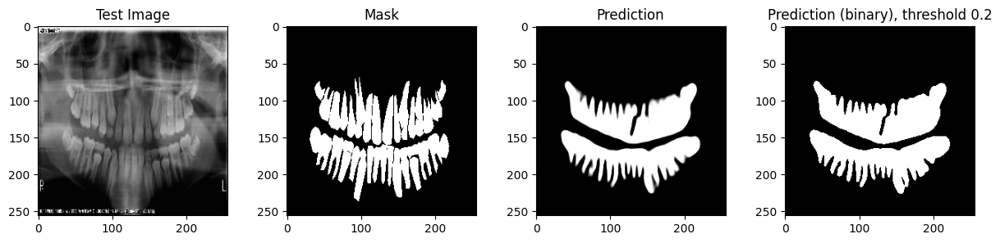

Train Accuracy,▁▆██████████████████████████████████████
Train IoU,▁▄▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇██▇█▇████████████████
Train Loss,█▇▅▄▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Train Precision,▁▆██████████████████████████████████████
Valid Accuracy,▁███████████████████████████████████████
Valid IoU,▁▆▇▆▇▇▇▇▇▇██▇███▇█████████▇█████████████
Valid Loss,█▇▅▄▃▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
Valid Precision,▁▅██████████████████████████████████████
Train Accuracy,0.95314
Train IoU,0.70811
Train Loss,0.04068


wandb: Sweep Agent: Waiting for job.
wandb: Sweep Agent: Exiting.


In [26]:
# 5-fach augmentation of train set
config = {
    'method': 'grid',
    'metric': {'name': 'Train Loss', 'goal': 'minimize'},
    'parameters': {
        'model': {'values': ['UNet_efficientnet_b4']}, 
        'data_type': {'values': ['large']}, # data type: small, other
        'pred_threshold': {'values': [0.2]}, # prediction threshold
        'batch_size': {'values': [16]}, 
        'learning_rate': {'values': [0.0001]}, 
        'epochs': {'values': [150]},
        'early_stop_epochs': {'values': [50]},
        'early_stop_threshold': {'values': [0.999]},
        'dropout_rate': {'values': [0.5]},
        'regularization_strength': {'values': [0.0001]},  
        'saved_model_name':{'values': ['best_model_5_aug.pth']}
    }}

sweep_id = wandb.sweep(config, project="dlbs", entity="weiping-zhang")
wandb.agent(sweep_id, function=lambda: train_eval_model(config))

In [281]:
# https://wandb.ai/weiping-zhang/dlbs/reports/b4-5x-augmentation--Vmlldzo2MzgzNDI0
%wandb weiping-zhang/dlbs/reports/b4-5x-augmentation--Vmlldzo2MzgzNDI0 -h 512

Result interpretation:

-   Validation set has very similar IoU and accuracy as the trainset, this indicates the model is likely not overfitting.
-   The predictions of both dataset are very good. Though the difference between train and validation set is not quite small. 

### 3.5.8 Testset evaluation

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Test Loss: 0.0431, Test IoU: 0.6837, Test Accuracy: 0.9528, Test Precision: 0.8485


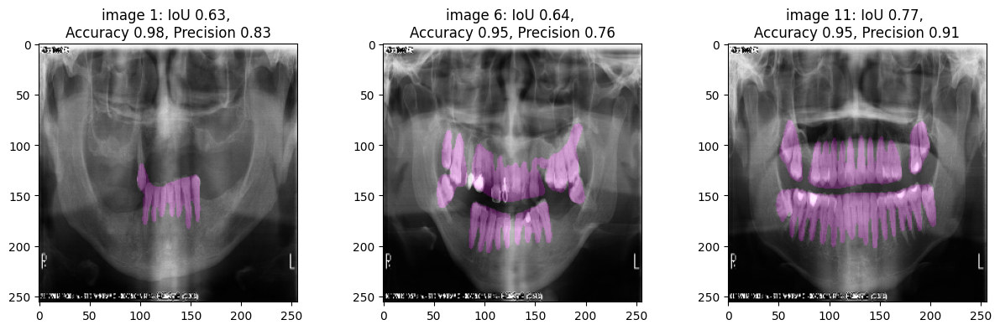

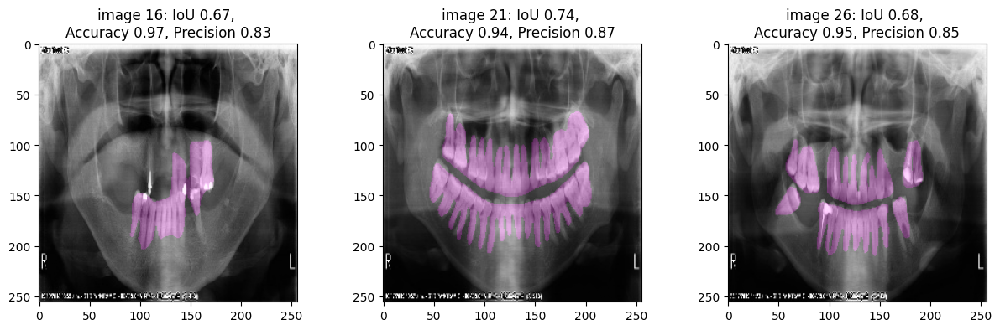

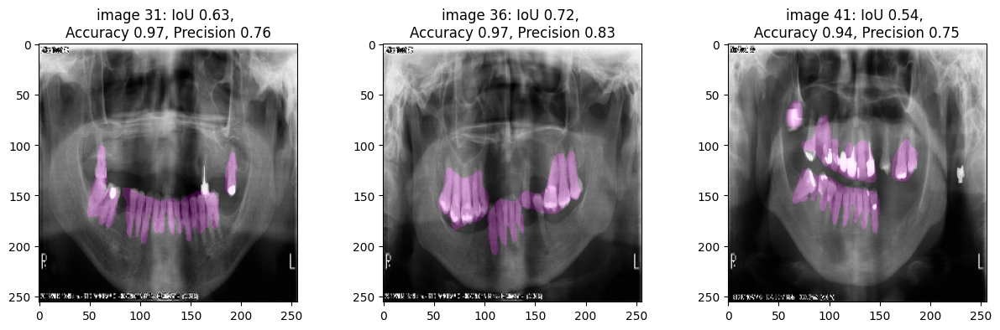

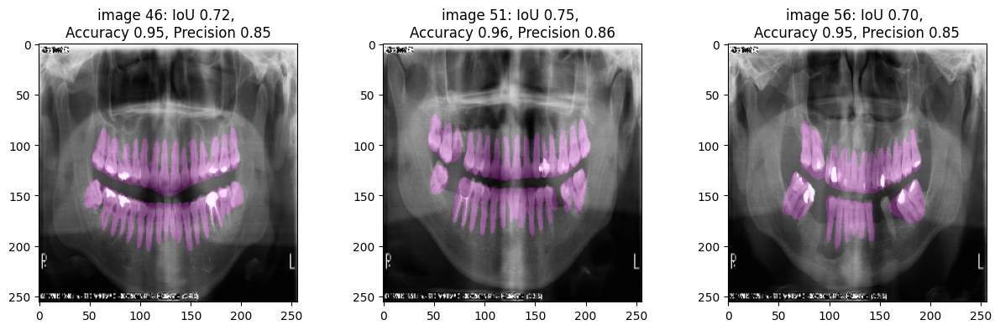

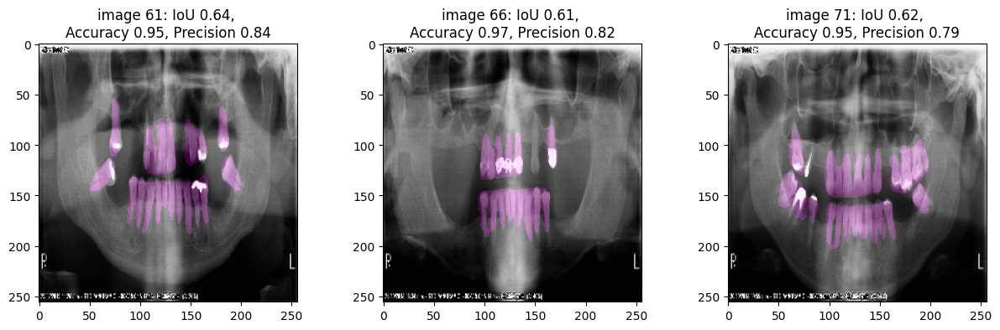

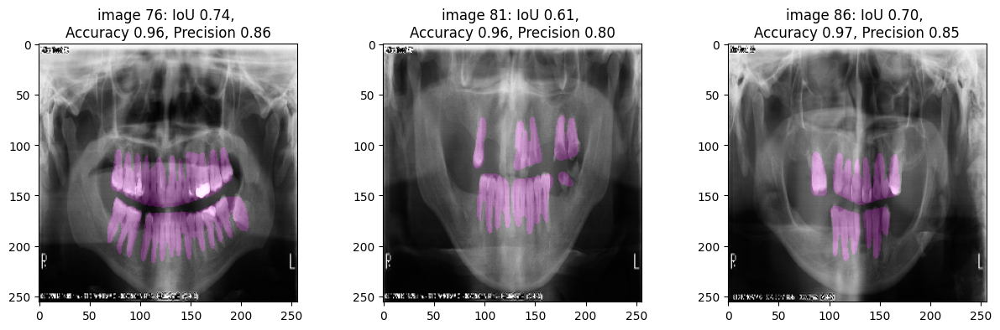

In [260]:
b4_5aug_results = eval_test('best_model_5_aug.pth')
# append the evaluation results to Dataframe
b4_5aug_row = {'model': 'UNet-efficient-b4 5-aug', 'IoU': np.mean(b4_5aug_results[3]), 'Accuracy': np.mean(b4_5aug_results[4]), 'Precision': np.mean(b4_5aug_results[5])}
results_models = pd.concat([results_models, pd.DataFrame([b4_5aug_row])], ignore_index=True)
# display every fifth images
idx_lst = [i*5 for i in range(len(b4_5aug_results[5])//5)]
display_overlap(idx_lst, b4_5aug_results)

Result interpretation:

-   Similar to upper two optimal models, this model could detect the teeth crown and neck very well, but has some difficulties to distinguish the deep roots from the background.
-   Only very few objects are not detected. 

This suggests, model has good performance recognizing the objects, but the exact area or pixels of the object could be improved.

# 4 Compare UNet and UNet-efficient-b4
## 4.1 Metrics 

In [261]:
results_models

,model,IoU,Accuracy,Precision
0,baseline: simple UNet,0.758680,0.967063,0.920663
1,UNet-efficient-b4 1-aug,0.646976,0.949163,0.852958
2,UNet-efficient-b4 5-aug,0.683679,0.952762,0.848511


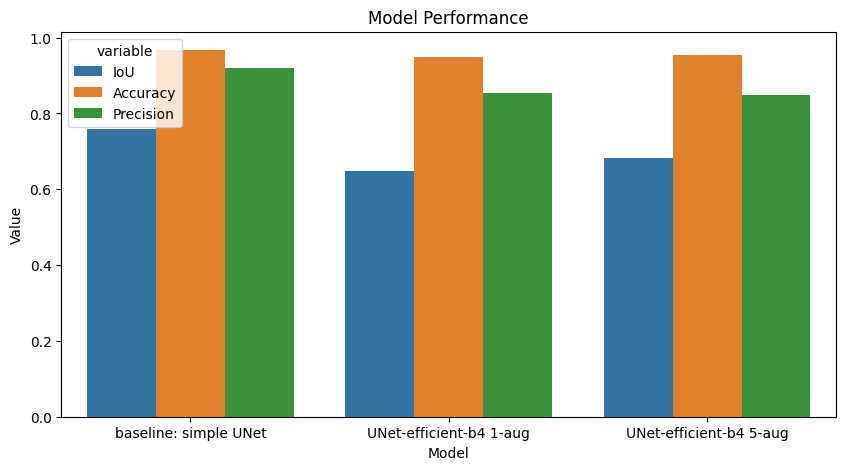

In [264]:
results_models_melt = pd.melt(results_models, id_vars=['model'], value_vars=['IoU', 'Accuracy', 'Precision'])

fig, ax = plt.subplots(figsize=(10, 5))
sns.barplot(x='model', y='value', hue='variable', data=results_models_melt, ax=ax)
ax.set_title('Model Performance')
ax.set_xlabel('Model')
ax.set_ylabel('Value')
plt.show()



Result interpretation:

1.  All three models have similar high performance of accuracy and precision.
2.  The simple UNet model has better IoU than the other two models.

## 4.2 Image prediction

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Baseline: simple UNet with 1x augmentation


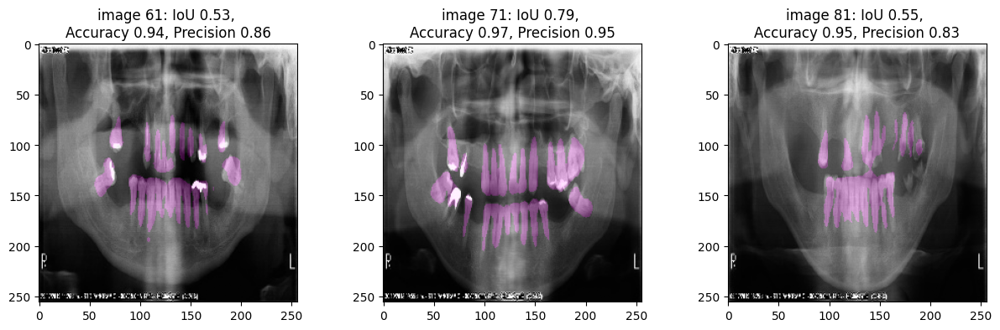

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


UNet-efficient-b4 with 1x augmentation


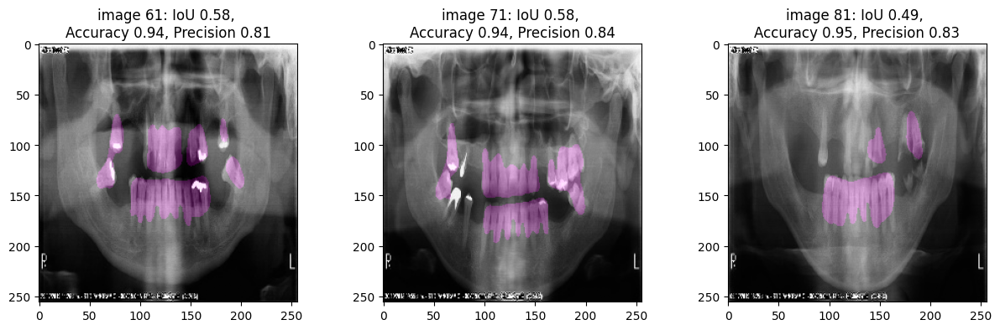

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


UNet-efficient-b4 with 5x augmentation


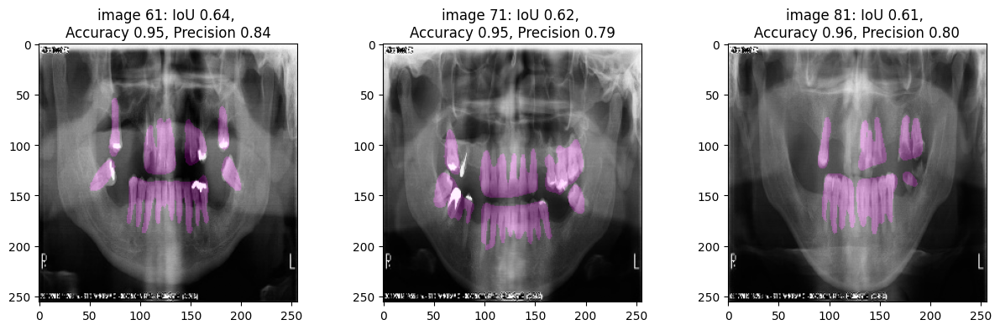

In [266]:
idx_lst = [i*10 for i in range(len(b4_5aug_results[5])//10)][-3:]
print("Baseline: simple UNet with 1x augmentation")
display_overlap(idx_lst, baseline_results)
print("UNet-efficient-b4 with 1x augmentation")
display_overlap(idx_lst, b4_1aug_results)
print("UNet-efficient-b4 with 5x augmentation")
display_overlap(idx_lst, b4_5aug_results)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Baseline: simple UNet with 1x augmentation


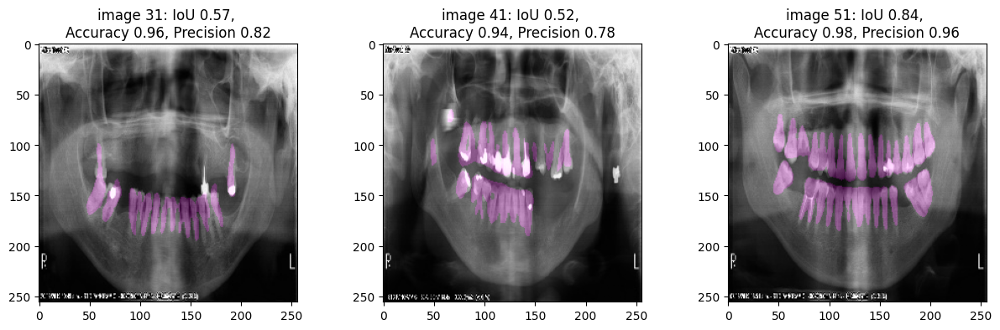

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


UNet-efficient-b4 with 1x augmentation


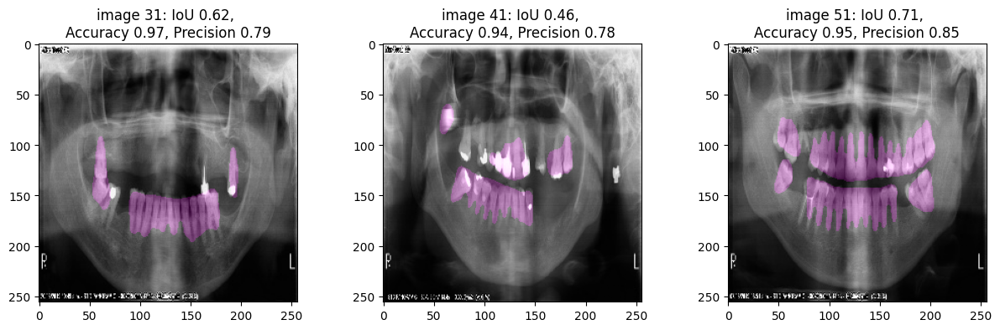

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


UNet-efficient-b4 with 5x augmentation


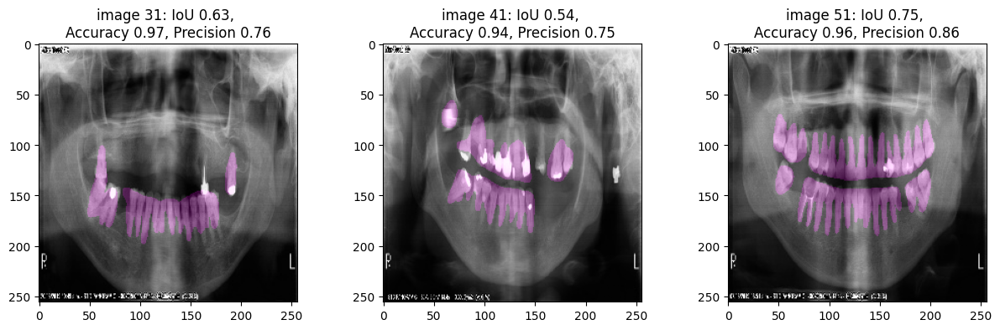

In [270]:
idx_lst = [i*10 for i in range(len(b4_5aug_results[5])//10)][3:6]
print("Baseline: simple UNet with 1x augmentation")
display_overlap(idx_lst, baseline_results)
print("UNet-efficient-b4 with 1x augmentation")
display_overlap(idx_lst, b4_1aug_results)
print("UNet-efficient-b4 with 5x augmentation")
display_overlap(idx_lst, b4_5aug_results)

Discussion:
-   simple UNet with 1x augmentation > UNet-pretrained with 5x augmentation >> UNet-pretrained with 1x augmentation 
-   Increasing training size from 1x augmentation to 5 times augmentation has significantly improved the model performance from 0.64 to 0.68. However, the simple UNet with 1x augmentation performance is much better 0.76.
-   The simple UNet and UNet-pretrained_5xaugmentation both models could recognize almost same amount of objects. The difference is, simple UNet could detect more pixels in deep roots. Therefore, it has higher IoU at all. 
-   Why simple UNet performed better than complexer UNet with pretrained efficientnet_b4 as encoder?
    1. the parameter of encoder block of the simple UNet is updated in training process. But in the pretrained efficientnet_b4 UNet, I used the pretrained parameters for encoder block. This means, in this case, self trained encoder parameter is more suitable to my images than the pretrained parameters.
    2. The UNet with pretrained model has more complex middle sub block and decoder subblock than the baseline. A more complex model needs a larger training dataset to reach a better performance. 

# 6 Summary

-   My best model is simple UNet with 1x augmentation, which has the highest IoU (0.76), precision (0.92) and accuracy (0.97). 
-   The model could recognize almost all of the teeth area, though it has some false negative predictions at the deep root parts of the teeth. Increasing the image contrast and brightness at the image preprocessing stage may help to improve the model performance.
-   Further fine tuning of the model hyperparameters can also help to improve the model performance.
-   For small dataset, it is essential to enlarge training size with data augmentation, it will improve the model performance and enhance the generalization on unseen data. 
-   For the tasks with small dataset, it may make more sense to train initial parameters in the model instead of using the parameters from a pretrained model, because self trained parameter is more suitable for the dataset. Computational cost would not be largely increased due to small datasize, but the performance could be strongly improved.